In [1]:
# import the required packages
import pandas as pd
import numpy as np
import random
import sklearn
import feature_engine
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import feature_engine.imputation as mdi
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

# Imputing missing data
from feature_engine.imputation import RandomSampleImputer

# Winsorization
from feature_engine.outliers import Winsorizer

# Numerical Transformation
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.transformation import LogTransformer
from feature_engine.transformation import ReciprocalTransformer
from feature_engine.transformation import PowerTransformer
from feature_engine.transformation import BoxCoxTransformer

# Discretization
from feature_engine.discretisation import EqualFrequencyDiscretiser

# Feature Scaling
from sklearn.preprocessing import StandardScaler

# Categorical Encoding 
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import OrdinalEncoder
from feature_engine.encoding import CountFrequencyEncoder

# Feature Adding
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA

# Pipeline
from sklearn.pipeline import Pipeline

pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# 1. HR Analytics

## 1.1 Load and Explore the data

In [2]:
# Load data
hr_df = pd.read_csv('hr_data.csv')

In [3]:
# Display first five rows of hr_df
hr_df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [4]:
# Info of hr_df
hr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [5]:
# Number of rows and columns in hr_df
hr_df.shape

(54808, 14)

In [6]:
# Split into numerical and categorical variables
cat_cols = [c for c in hr_df.columns if hr_df[c].dtypes=='O']
print(cat_cols)

num_cols = [n for n in hr_df.columns if hr_df[n].dtypes!='O']
print(num_cols)

['department', 'region', 'education', 'gender', 'recruitment_channel']
['employee_id', 'no_of_trainings', 'age', 'previous_year_rating', 'length_of_service', 'KPIs_met >80%', 'awards_won?', 'avg_training_score', 'is_promoted']


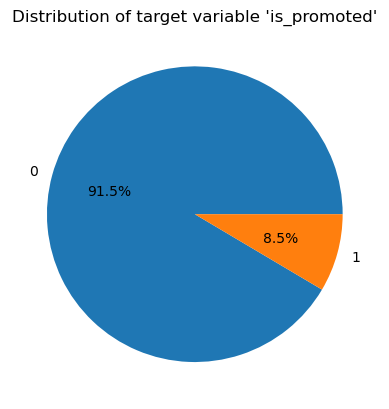

In [7]:
# Univariate analysis of target variable -- is_promoted
values = hr_df['is_promoted'].value_counts()
labels = values.index

plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.title("Distribution of target variable 'is_promoted'")
plt.show()

In [8]:
# Univariate analyis of each numerical variable
hr_df[num_cols].describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


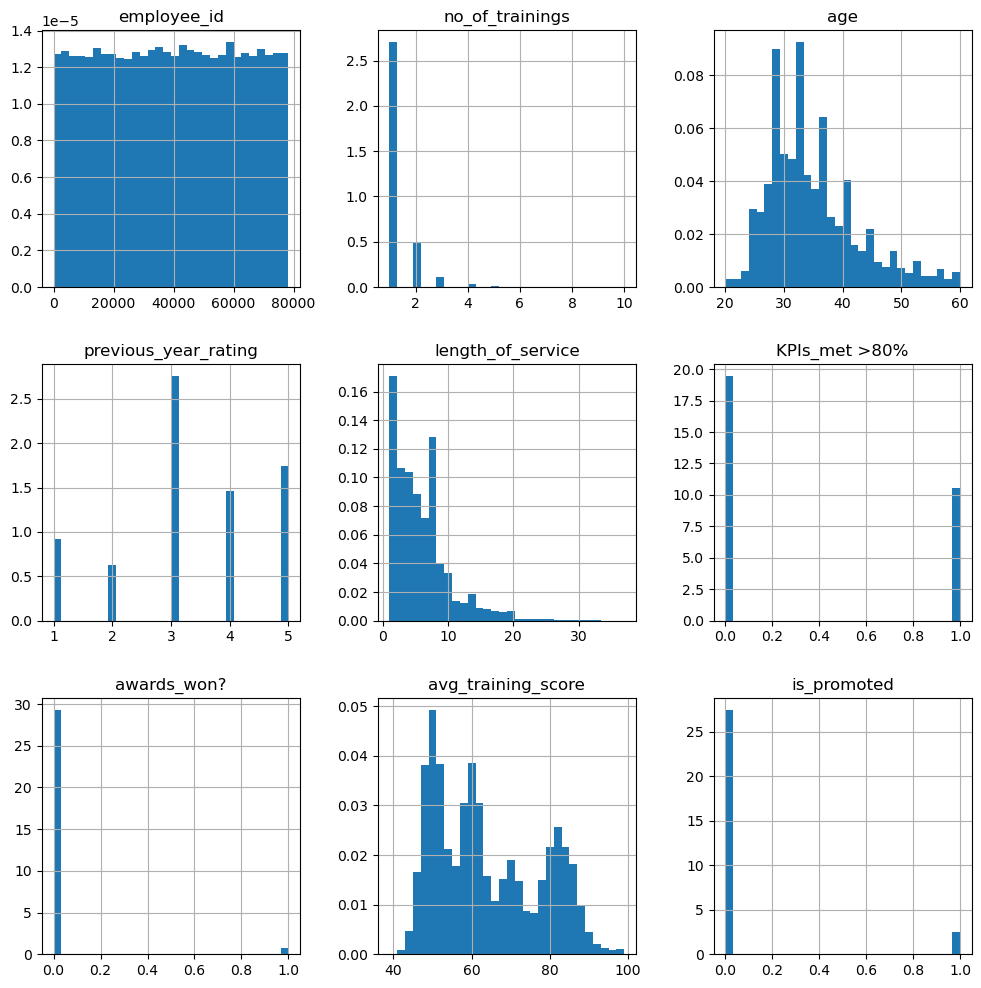

In [9]:
# Find out which variables are continuous or discrete
hr_df[num_cols].hist(bins=30, figsize=(12,12), density=True)
plt.show()

In [10]:
# Values in each numerical variable
for c in num_cols:
    print(f'{c} \n------------------------')
    print(hr_df[c].value_counts())
    print("\n")

employee_id 
------------------------
65438    1
16223    1
38250    1
68086    1
78080    1
        ..
38645    1
76563    1
46788    1
75029    1
51526    1
Name: employee_id, Length: 54808, dtype: int64


no_of_trainings 
------------------------
1     44378
2      7987
3      1776
4       468
5       128
6        44
7        12
8         5
10        5
9         5
Name: no_of_trainings, dtype: int64


age 
------------------------
30    3665
32    3534
31    3534
29    3405
33    3210
28    3147
34    3076
27    2827
35    2711
36    2517
37    2165
26    2060
38    1923
39    1695
40    1663
25    1299
41    1289
42    1149
43     992
44     847
24     845
45     760
46     697
48     557
47     557
50     521
49     441
23     428
51     389
53     364
52     351
54     313
55     294
56     264
57     238
22     231
60     217
58     213
59     209
20     113
21      98
Name: age, dtype: int64


previous_year_rating 
------------------------
3.0    18618
5.0    11741
4.0     9877

In [11]:
# Univariate analyis of each categorical variable
hr_df[cat_cols].describe()

,department,region,education,gender,recruitment_channel
count,54808,54808,52399,54808,54808
unique,9,34,3,2,3
top,Sales & Marketing,region_2,Bachelor's,m,other
freq,16840,12343,36669,38496,30446


In [12]:
# Values in each categorical variable
for c in cat_cols:
    print(f'{c} \n------------------------')
    print(hr_df[c].value_counts())
    print("\n")

department 
------------------------
Sales & Marketing    16840
Operations           11348
Technology            7138
Procurement           7138
Analytics             5352
Finance               2536
HR                    2418
Legal                 1039
R&D                    999
Name: department, dtype: int64


region 
------------------------
region_2     12343
region_22     6428
region_7      4843
region_15     2808
region_13     2648
region_26     2260
region_31     1935
region_4      1703
region_27     1659
region_16     1465
region_28     1318
region_11     1315
region_23     1175
region_29      994
region_32      945
region_19      874
region_20      850
region_14      827
region_25      819
region_17      796
region_5       766
region_6       690
region_30      657
region_8       655
region_10      648
region_1       610
region_24      508
region_12      500
region_9       420
region_21      411
region_3       346
region_34      292
region_33      269
region_18       31
Name: re

In [13]:
# Bivariate analysis
hr_df.corr()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
employee_id,1.000000,-0.005121,0.000437,0.004533,0.001274,-0.002501,0.008420,-0.000586,0.001206
no_of_trainings,-0.005121,1.000000,-0.081278,-0.063126,-0.057275,-0.045576,-0.007628,0.042517,-0.024896
age,0.000437,-0.081278,1.000000,0.006008,0.657111,-0.025592,-0.008169,-0.048380,-0.017166
previous_year_rating,0.004533,-0.063126,0.006008,1.000000,0.000253,0.351578,0.027738,0.075139,0.159320
length_of_service,0.001274,-0.057275,0.657111,0.000253,1.000000,-0.077693,-0.039927,-0.038122,-0.010670
KPIs_met >80%,-0.002501,-0.045576,-0.025592,0.351578,-0.077693,1.000000,0.097000,0.078391,0.221582
awards_won?,0.008420,-0.007628,-0.008169,0.027738,-0.039927,0.097000,1.000000,0.072138,0.195871
avg_training_score,-0.000586,0.042517,-0.048380,0.075139,-0.038122,0.078391,0.072138,1.000000,0.181147
is_promoted,0.001206,-0.024896,-0.017166,0.159320,-0.010670,0.221582,0.195871,0.181147,1.000000


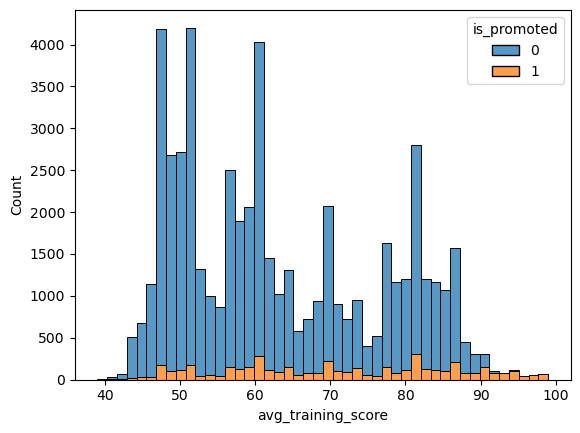

In [14]:
# Observe relationships between target and variables
sns.histplot(data=hr_df, x='avg_training_score', hue='is_promoted', multiple = 'stack')
plt.show()

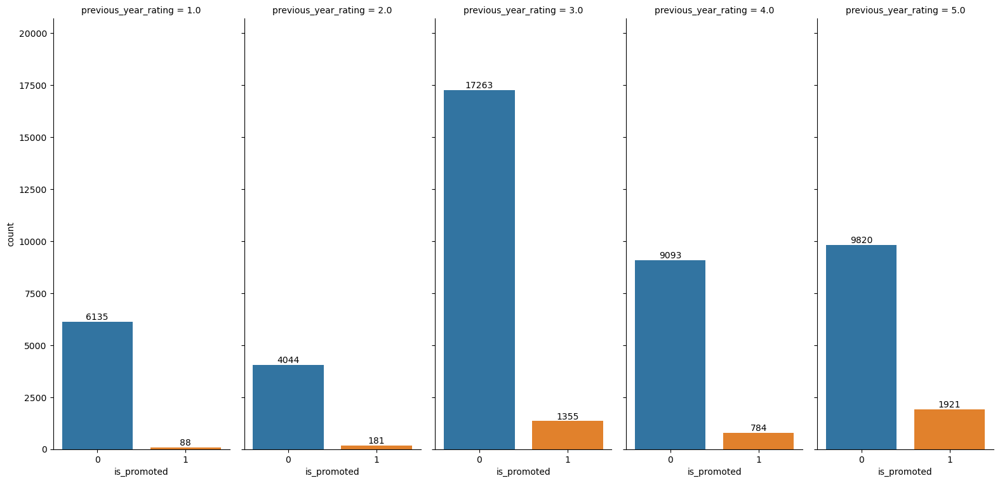

In [15]:
def plot_catplot(df, variable):
    p = sns.catplot(x='is_promoted', col=variable, col_wrap=5, data=df, kind='count', height=4, aspect=.7)
    p.fig.set_size_inches(16, 9)
    p.fig.subplots_adjust(top=0.9,hspace= 0.5)
    for ax in p.axes.ravel():
        # add annotations
        for c in ax.containers:
            labels = [v.get_height().astype(int) for v in c]
            ax.bar_label(c, labels=labels, label_type='edge')
        ax.margins(y=0.2)
    
    # Display plot
    plt.show()

plot_catplot(hr_df, 'previous_year_rating')

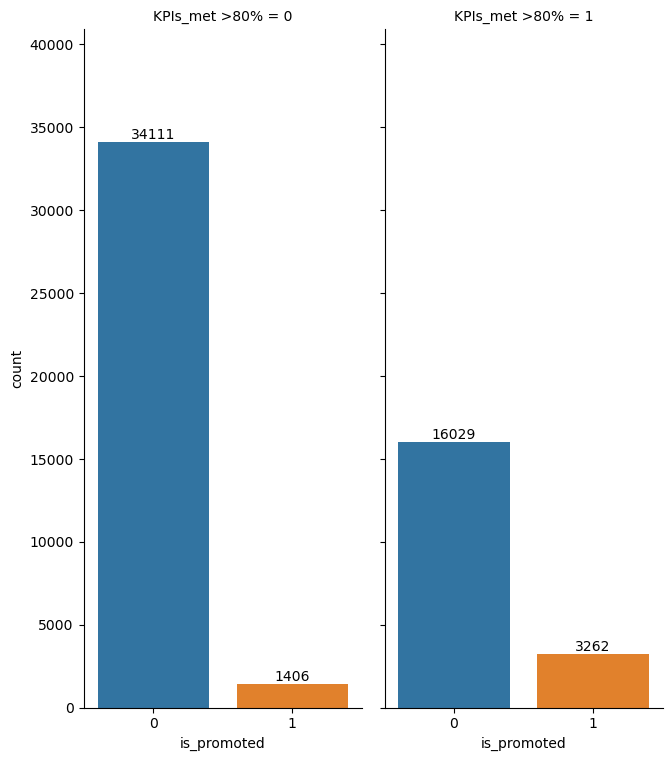

In [16]:
plot_catplot(hr_df, 'KPIs_met >80%')

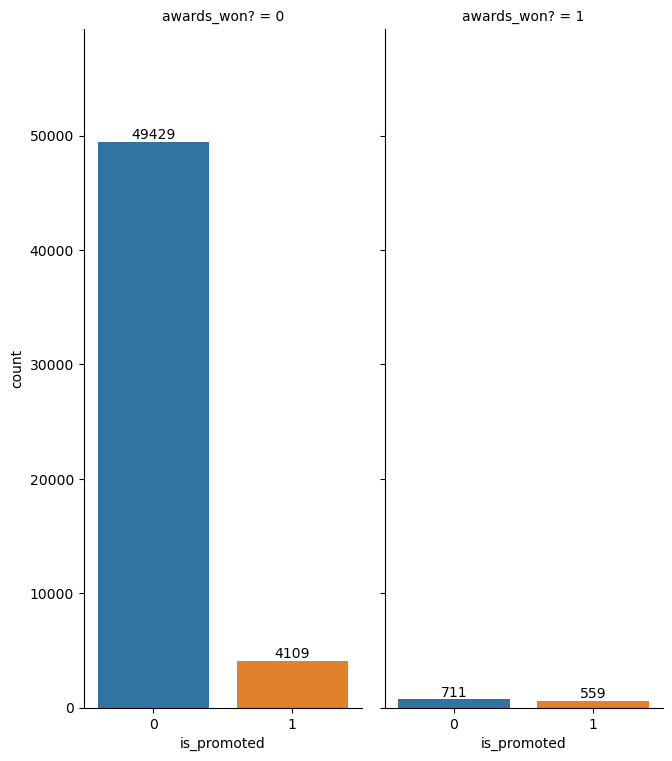

In [17]:
plot_catplot(hr_df, 'awards_won?')

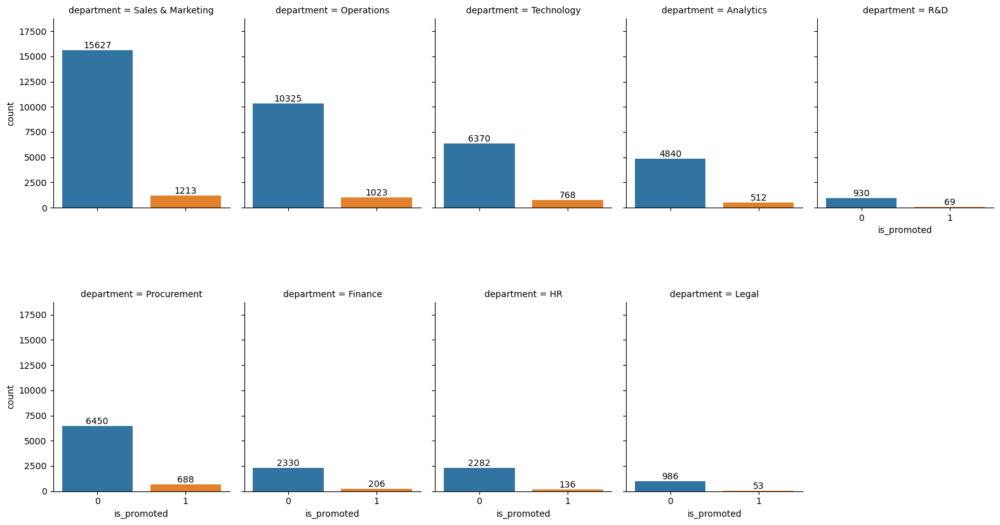

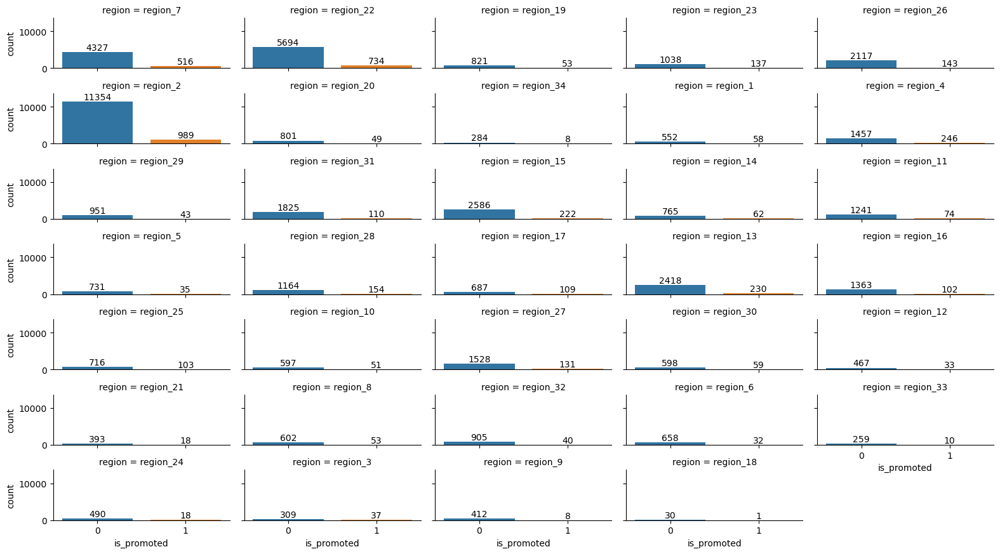

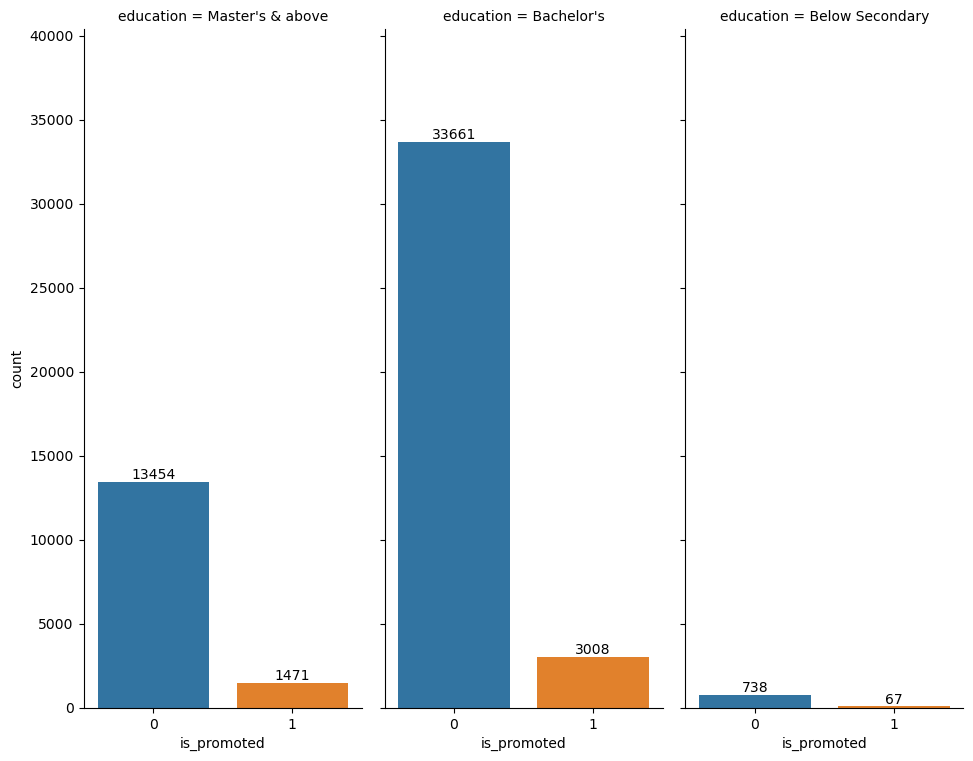

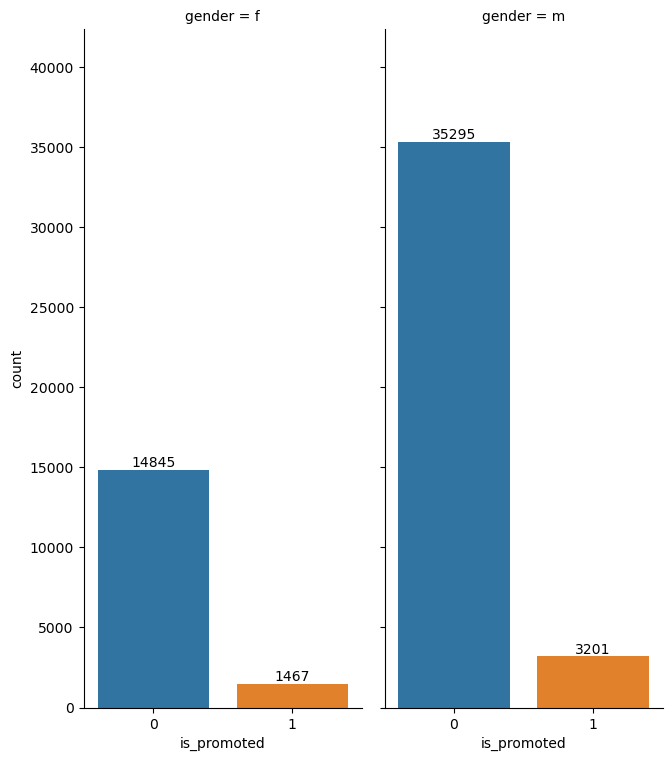

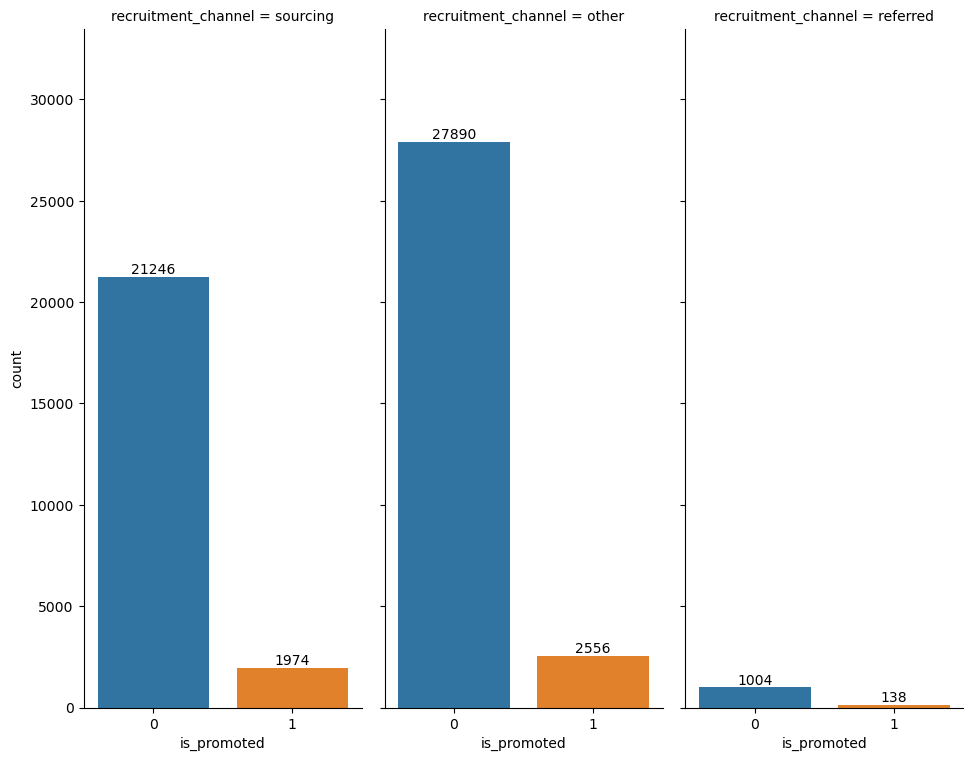

In [18]:
for c in cat_cols:
    plot_catplot(hr_df, c)

## 1.2 Cleanse and Transform the data

### 1.2.1 Quantifying Missing Data

In [19]:
# Number of missing values in each column
hr_df.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

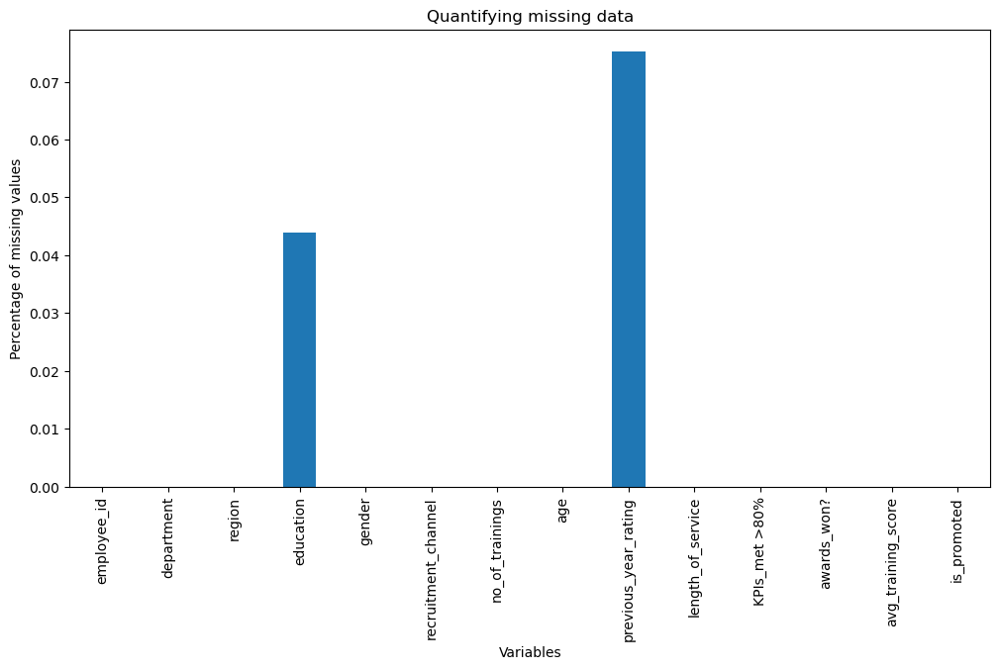

In [20]:
# Percentage of missing values
hr_df.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')
plt.show()

### 1.2.2 Handling missing values

In [21]:
# Drop null values in education
hr_df.dropna(subset = ['education'], inplace=True)
hr_df['education'].isnull().sum()

0

In [22]:
# Check rows of previous_year_rating with nulls
hr_df.loc[hr_df['previous_year_rating'].isnull()]

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
23,71177,Procurement,region_5,Bachelor's,m,other,1,27,NaN,1,0,0,70,0
29,74759,Sales & Marketing,region_4,Bachelor's,m,sourcing,1,26,NaN,1,0,0,44,0
56,45709,Sales & Marketing,region_31,Bachelor's,f,other,1,29,NaN,1,0,0,49,0
58,26599,Sales & Marketing,region_16,Bachelor's,m,other,2,27,NaN,1,1,0,47,0
62,9150,Analytics,region_22,Bachelor's,f,other,1,28,NaN,1,1,0,80,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54703,74615,R&D,region_31,Bachelor's,m,sourcing,1,30,NaN,1,1,0,88,0
54734,11685,Operations,region_15,Bachelor's,m,sourcing,1,31,NaN,1,1,0,56,1
54746,10546,Finance,region_6,Bachelor's,m,other,1,28,NaN,1,1,0,61,0
54773,37919,Finance,region_2,Bachelor's,m,other,1,23,NaN,1,1,0,61,0


In [23]:
# Check number of rows where length_of_service is 1 and previous_year_rating is null
hr_df[hr_df['length_of_service'] == 1 & hr_df['previous_year_rating'].isnull()].shape[0]

3739

In [24]:
# Replace null values in previous_year_rating
hr_df['previous_year_rating'].fillna(0, inplace = True)
hr_df['previous_year_rating'].value_counts()

3.0    17867
5.0    11362
4.0     9509
1.0     5887
2.0     4035
0.0     3739
Name: previous_year_rating, dtype: int64

### 1.2.3 Determine Cardinality

In [25]:
hr_df.nunique()

employee_id             52399
department                  9
region                     34
education                   3
gender                      2
recruitment_channel         3
no_of_trainings            10
age                        41
previous_year_rating        6
length_of_service          35
KPIs_met >80%               2
awards_won?                 2
avg_training_score         61
is_promoted                 2
dtype: int64

In [26]:
# Drop employee_id
hr_df.drop(columns=['employee_id'], inplace = True)

### 1.2.4 Identifying rare categories

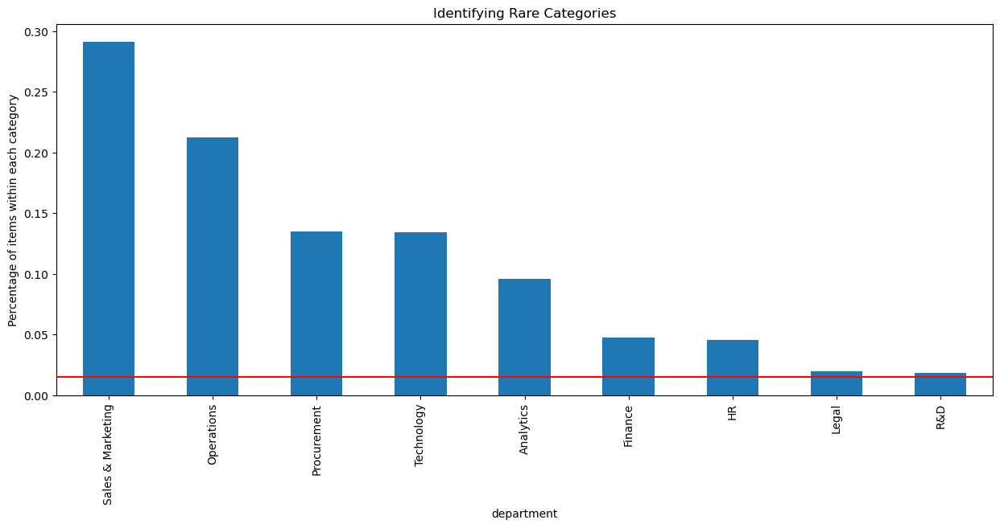

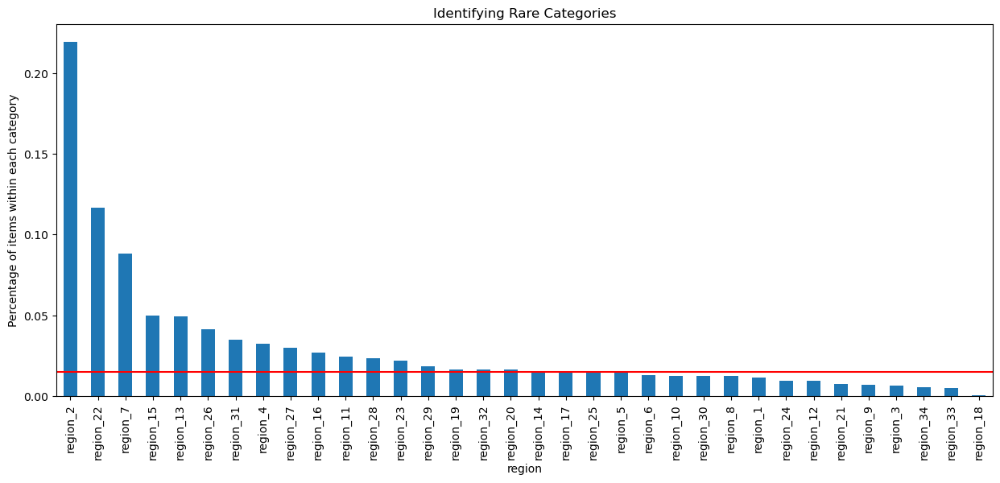

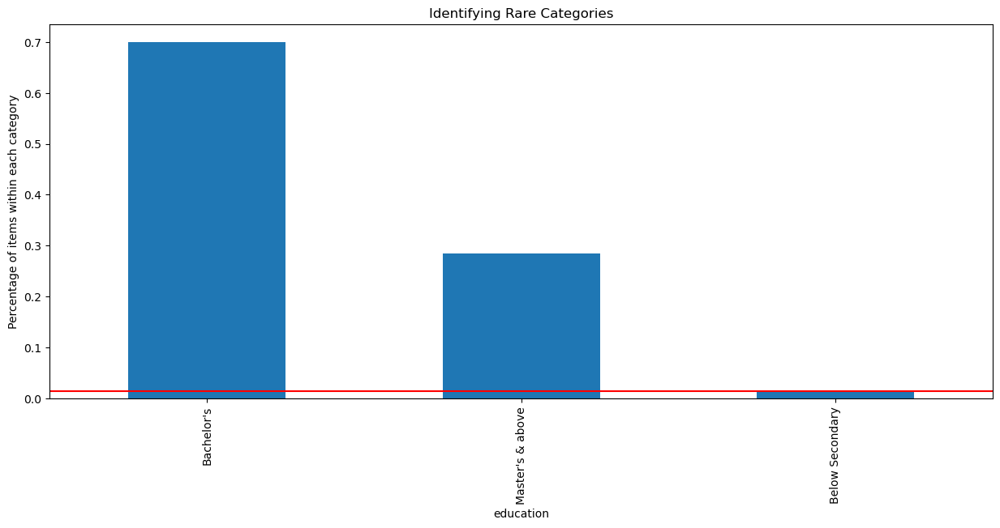

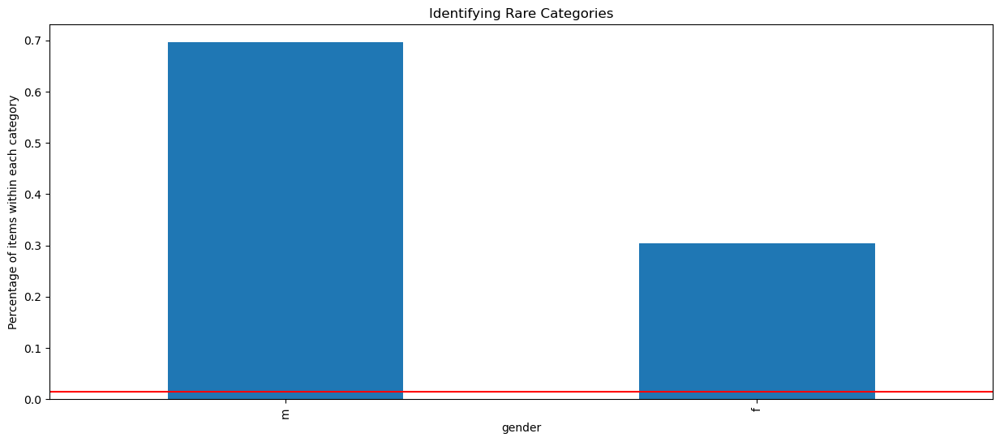

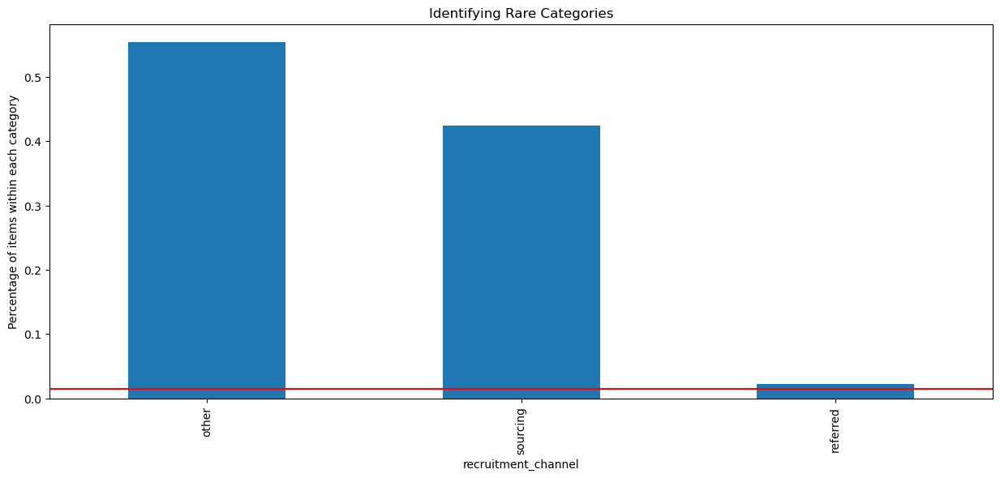

In [27]:
# Identifying rare categories

total_item = len(hr_df)

def rare_cat_plots(df, variable):
    label_freq = df[variable].value_counts() / total_item
    
    plt.figure(figsize=(15,6))
    
    fig = label_freq.sort_values(ascending=False).plot.bar()

    # Add a line to signal % frequency limit under which we will consider a category as rare
    fig.axhline(y=0.015, color='red')

    fig.set_ylabel('Percentage of items within each category')
    fig.set_xlabel(f'{variable}')
    fig.set_title('Identifying Rare Categories')
    plt.show()        
    
for c in cat_cols:
    rare_cat_plots(hr_df,c)

In [28]:
# Regroup rare categories in region
label_freq = hr_df['region'].value_counts() / total_item
    
# Identify rare categories based on the threshold
rare_categories = label_freq[label_freq < 0.015].index.tolist()

hr_df['region'] = hr_df['region'].apply(lambda x: 'other' if x in rare_categories else x)

# Display categories in region
hr_df['region'].value_counts()

region_2     11497
other         7462
region_22     6108
region_7      4624
region_15     2617
region_13     2592
region_26     2160
region_31     1841
region_4      1701
region_27     1575
region_16     1410
region_11     1291
region_28     1234
region_23     1147
region_29      975
region_19      864
region_32      861
region_20      849
region_14      804
region_17      787
Name: region, dtype: int64

### 1.2.5 Check variable distribution & outliers

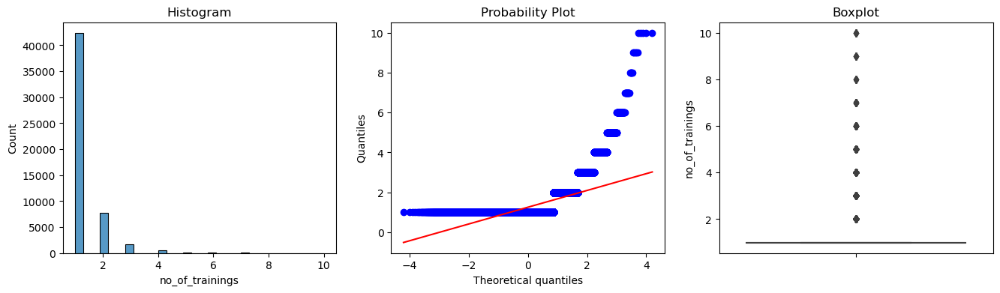

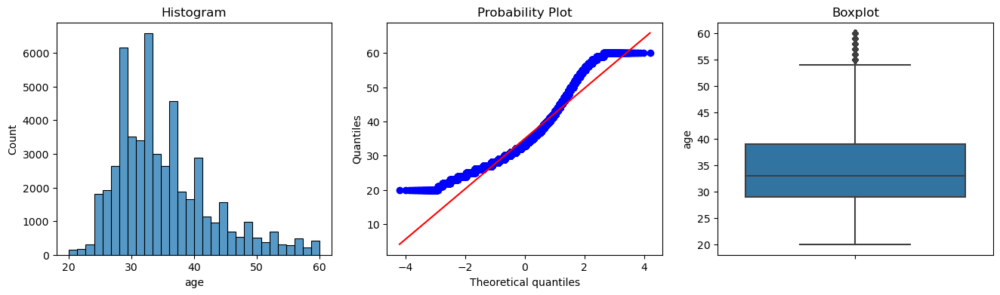

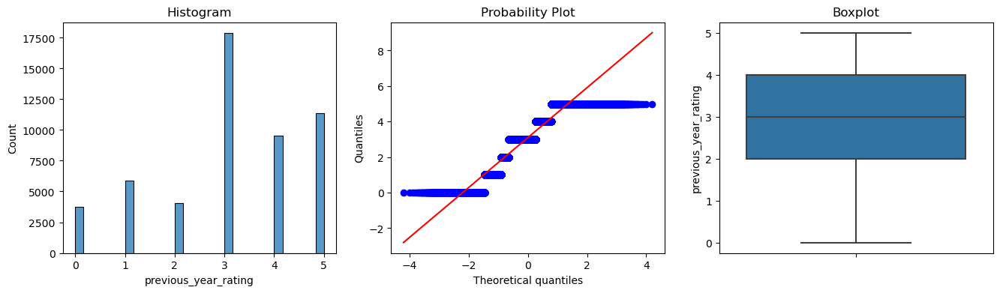

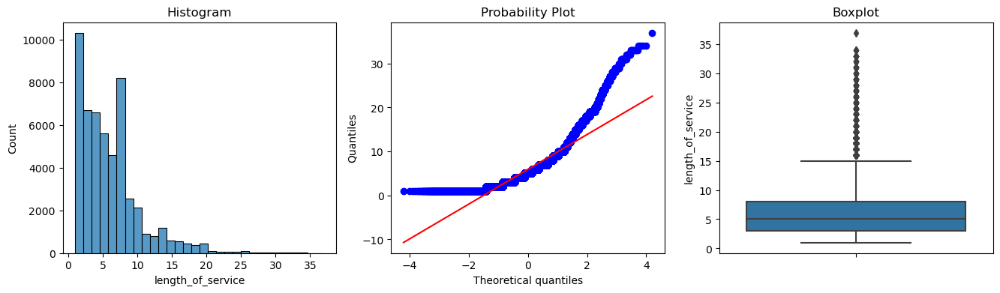

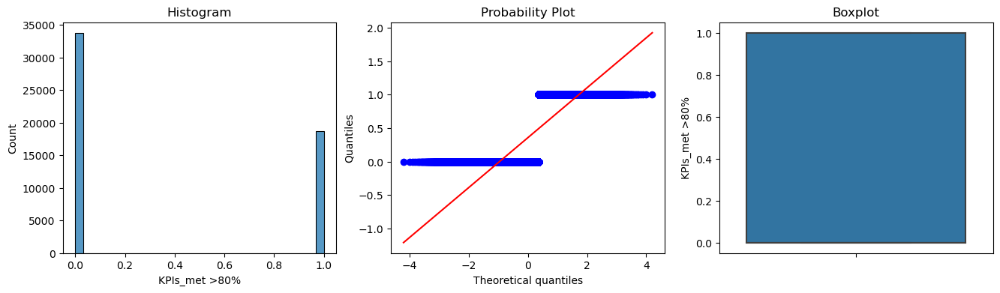

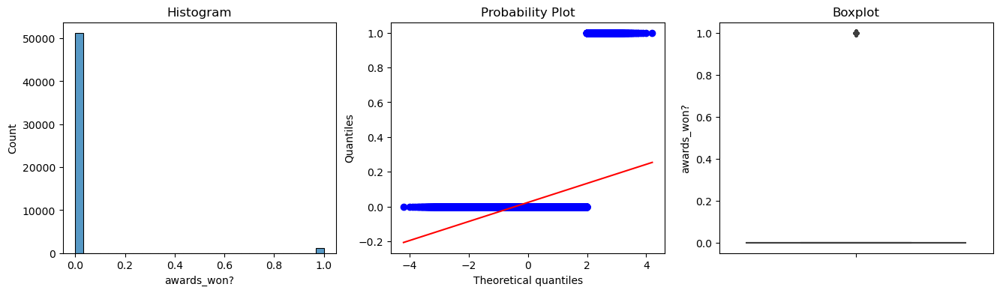

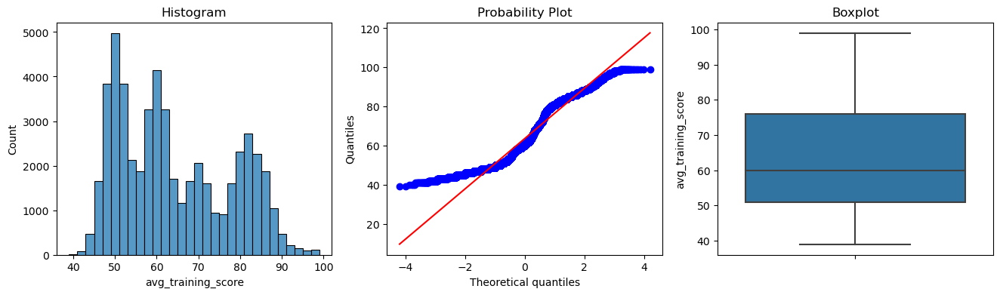

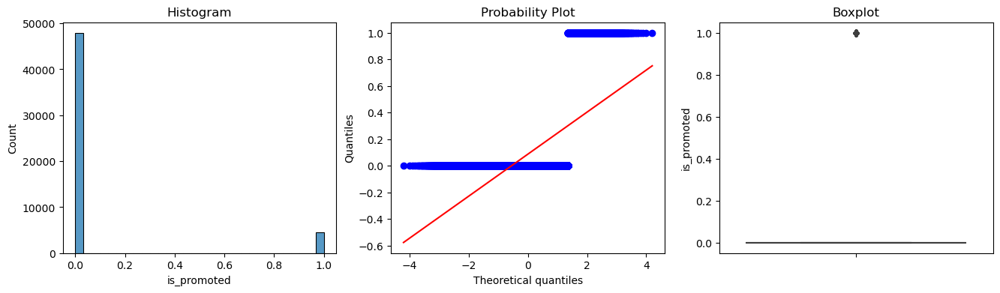

In [29]:
# Diagnostic plots
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

num_cols = [n for n in hr_df.columns if hr_df[n].dtypes!='O']

for n in num_cols:
    diagnostic_plots(hr_df, n)

### 1.2.6 Handling Outliers
#### 1.2.6.1 Using Winsorization

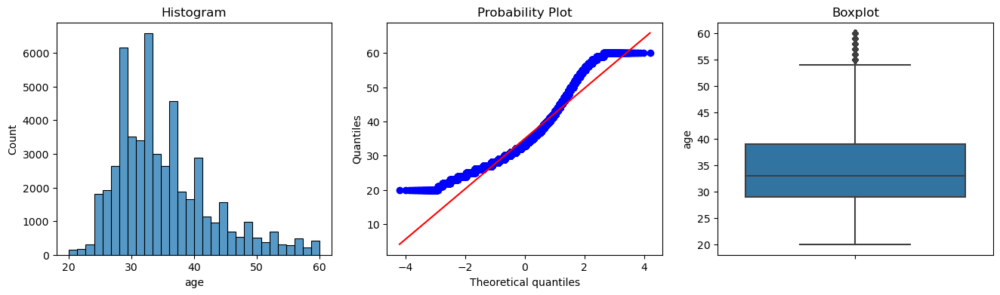

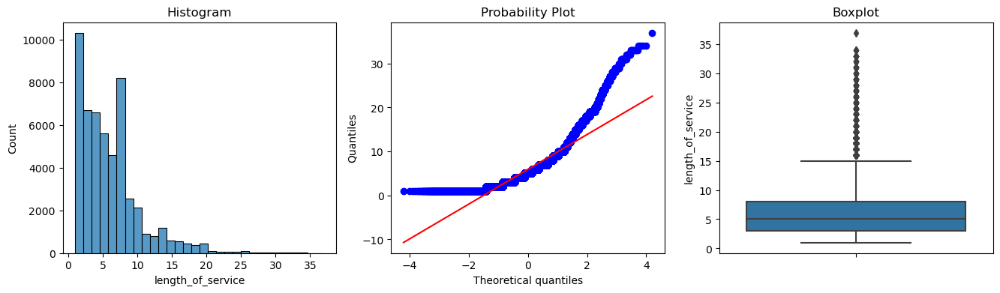

In [30]:
# Before Winsorisation of age and length_of_service
diagnostic_plots(hr_df, 'age')
diagnostic_plots(hr_df, 'length_of_service')

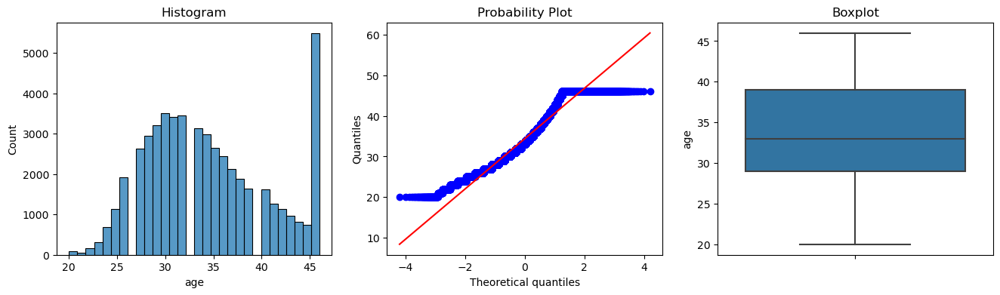

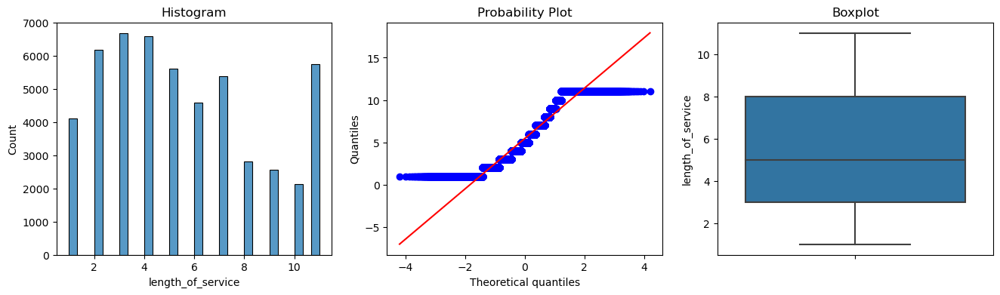

In [31]:
# After Winsorisation
windsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='right', 
                        fold =0.1,
                        variables=['age', 'length_of_service'])

windsorizer.fit(hr_df)
hr_df_t = windsorizer.transform(hr_df)

diagnostic_plots(hr_df_t, 'age')
diagnostic_plots(hr_df_t, 'length_of_service')

#### 1.2.6.2 Using Numerical Transformations

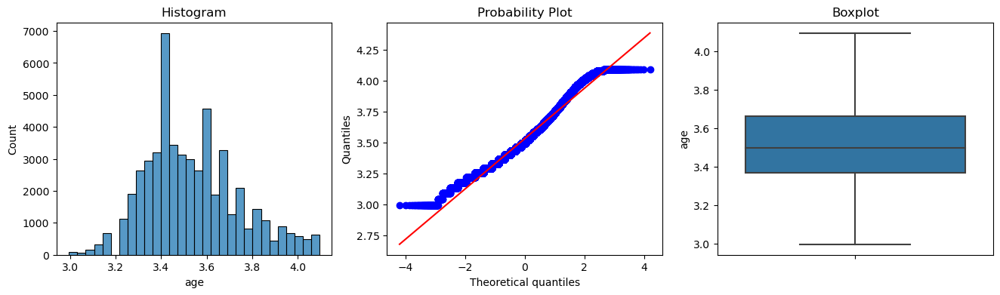

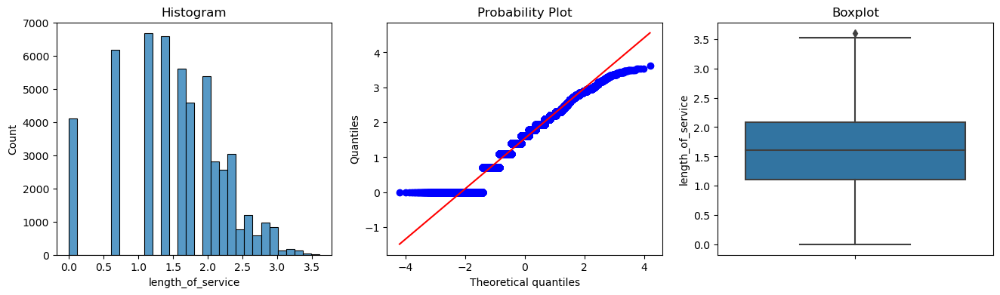

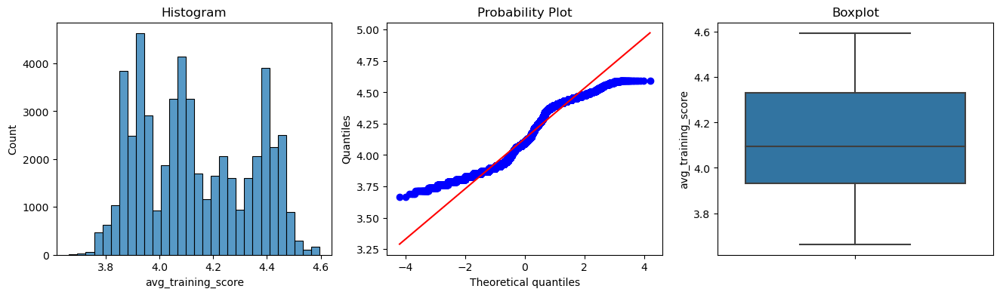

In [32]:
# using log transformation
# initialize the transformer
lt = LogTransformer(variables=['age','length_of_service', 'avg_training_score'])

# fit transformer to data set
lt.fit(hr_df)

# transform variables within our data set
hr_df_log = lt.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_log, 'age')
diagnostic_plots(hr_df_log, 'length_of_service')
diagnostic_plots(hr_df_log, 'avg_training_score')

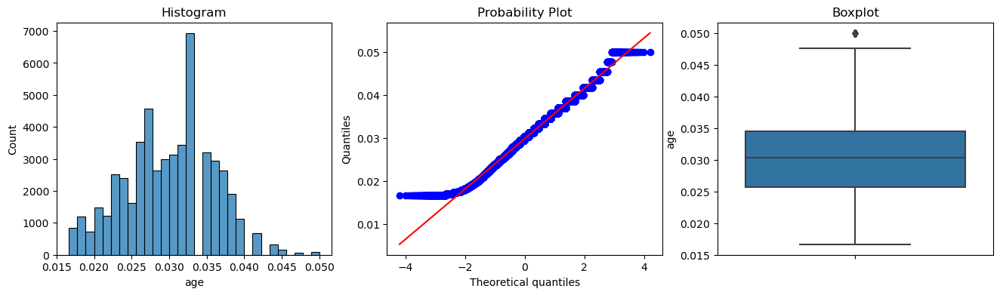

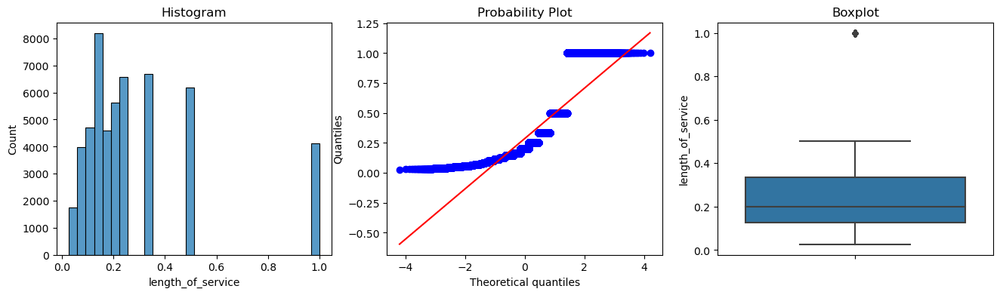

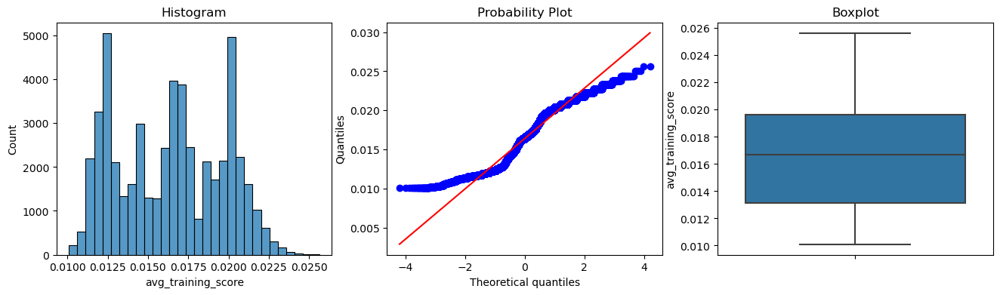

In [33]:
# using reciprocal transformation
# initialize the transformer
rt = ReciprocalTransformer(variables = ['age','length_of_service', 'avg_training_score'])

# fit transformer to the entire dataframe
rt.fit(hr_df)

# transform the indicated variables within our data set
hr_df_rec = rt.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_rec, 'age')
diagnostic_plots(hr_df_rec, 'length_of_service')
diagnostic_plots(hr_df_rec, 'avg_training_score')

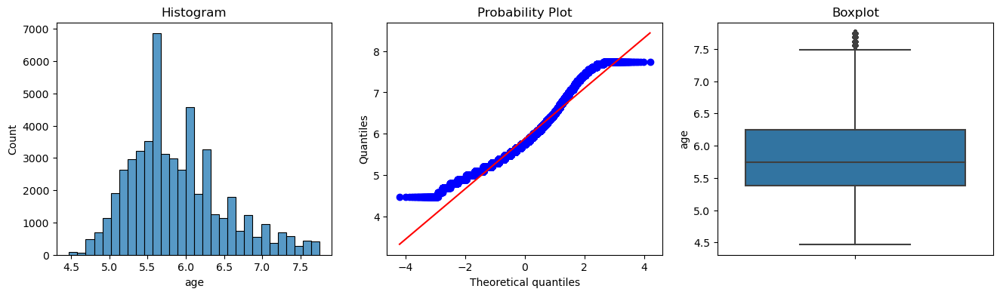

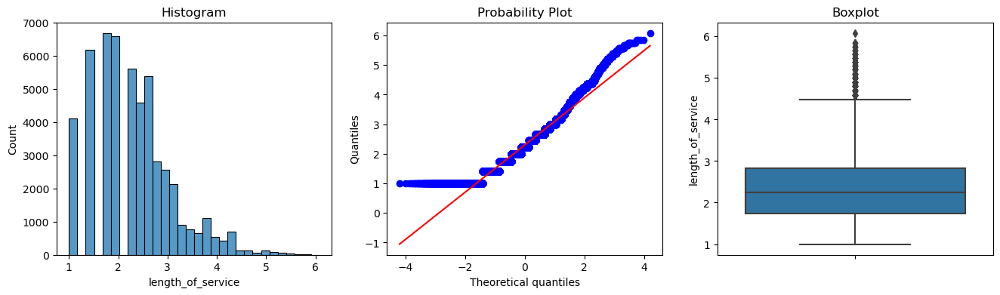

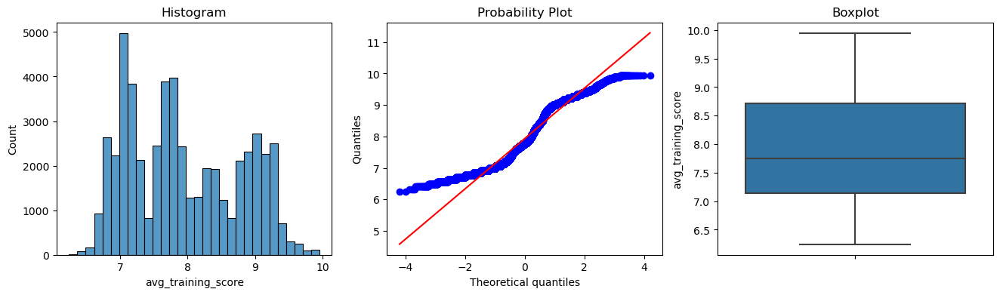

In [34]:
# using square root transformation
# set up PowerTransformer with the square root exponent
et = PowerTransformer(variables = ['age','length_of_service', 'avg_training_score'], exp=1/2)

# fit transformer to data 
et.fit(hr_df)

# transform indicated variables within our dataframe
hr_df_sq = et.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_sq, 'age')
diagnostic_plots(hr_df_sq, 'length_of_service')
diagnostic_plots(hr_df_sq, 'avg_training_score')

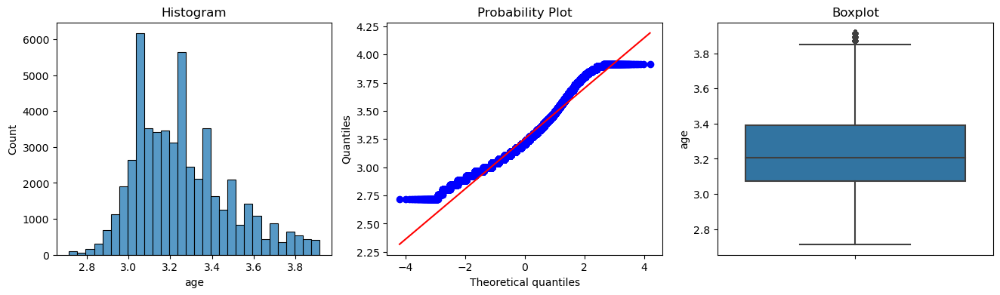

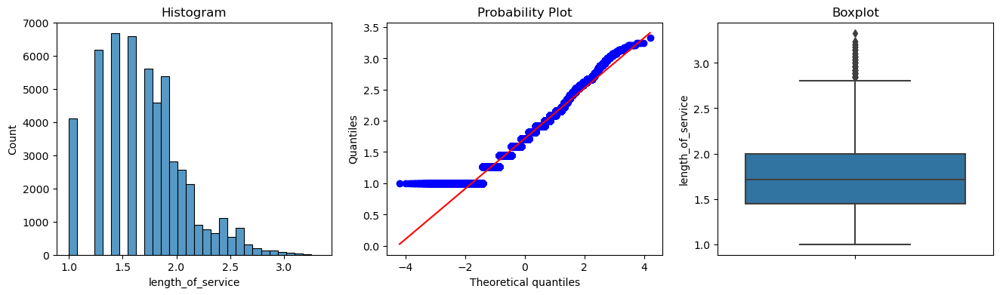

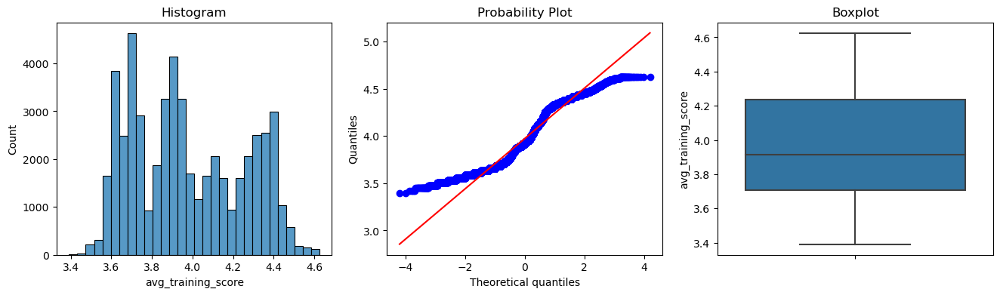

In [35]:
# using cube root transformation
# set up PowerTransformer with the square root exponent
et = PowerTransformer(variables = ['age','length_of_service', 'avg_training_score'], exp=1/3)

# fit transformer to data 
et.fit(hr_df)

# transform indicated variables within our dataframe
hr_df_cr = et.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_cr, 'age')
diagnostic_plots(hr_df_cr, 'length_of_service')
diagnostic_plots(hr_df_cr, 'avg_training_score')

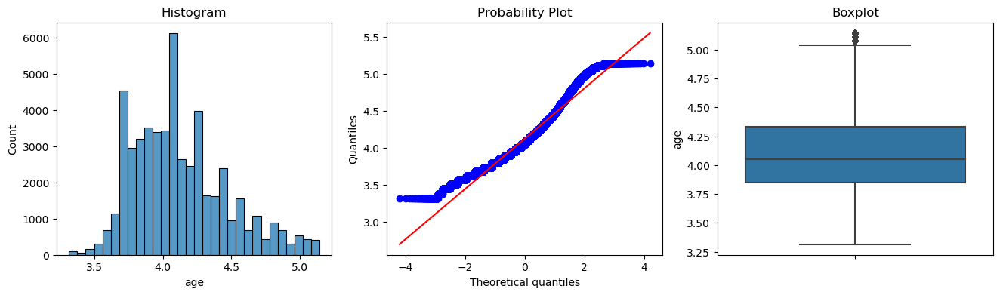

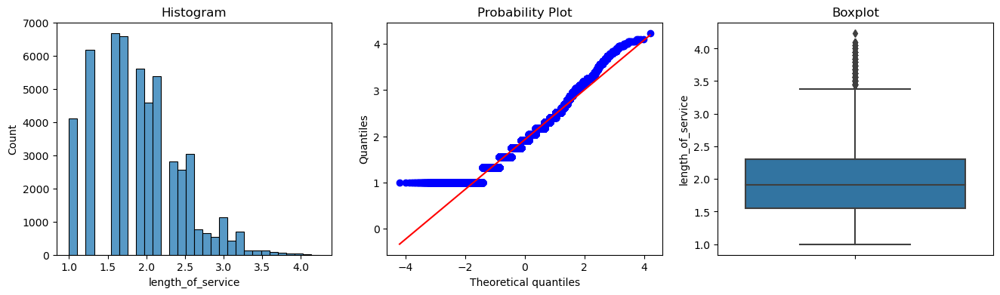

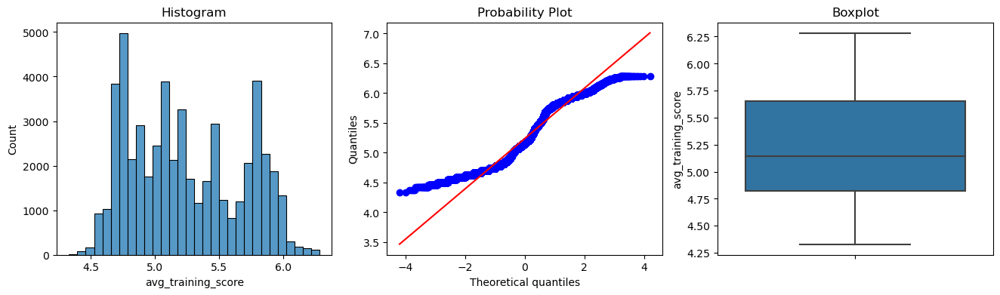

In [36]:
# using power transformation

# initialize the transformer with the variables to transform and the desired exponent

et = PowerTransformer(variables = ['age','length_of_service', 'avg_training_score'], exp=0.4)

# fit transformer to data
et.fit(hr_df)

# transform indicated variables in the dataset
hr_df_p = et.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_p, 'age')
diagnostic_plots(hr_df_p, 'length_of_service')
diagnostic_plots(hr_df_p, 'avg_training_score')

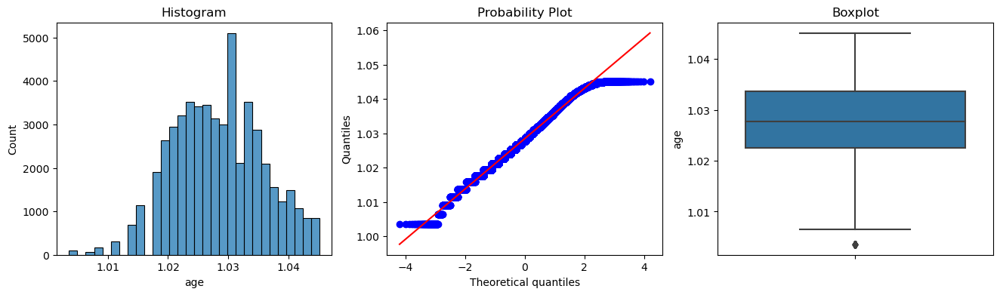

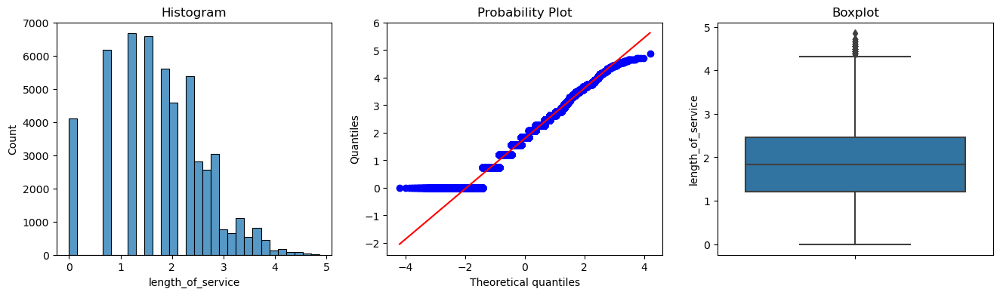

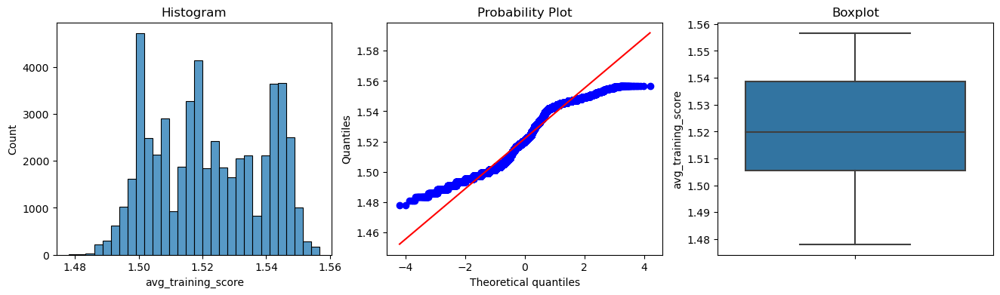

In [37]:
# using box-cox transformation
# initialize the transformer with a group of variables to transform
bct = BoxCoxTransformer(variables = ['age','length_of_service', 'avg_training_score'])

# fit transformer to the data set
bct.fit(hr_df)

# transform the indicated variables in our dataframe and returns a new dataframe
hr_df_bc = bct.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_bc, 'age')
diagnostic_plots(hr_df_bc, 'length_of_service')
diagnostic_plots(hr_df_bc, 'avg_training_score')

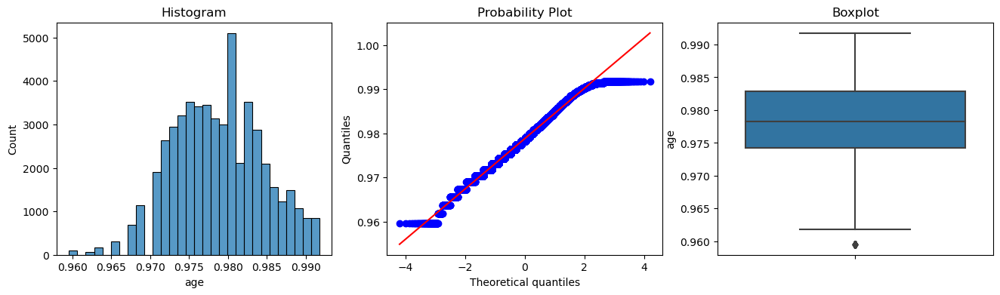

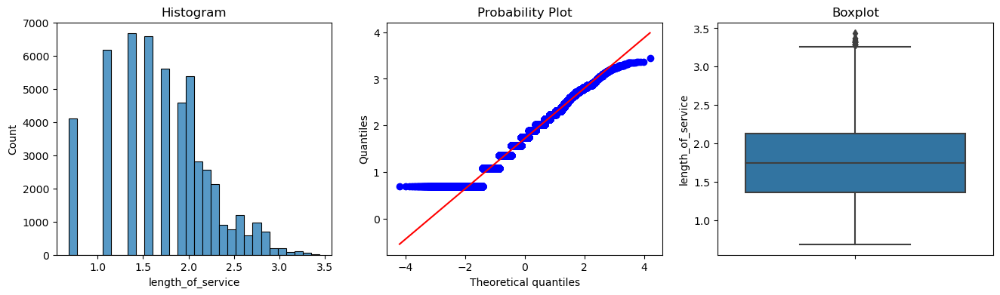

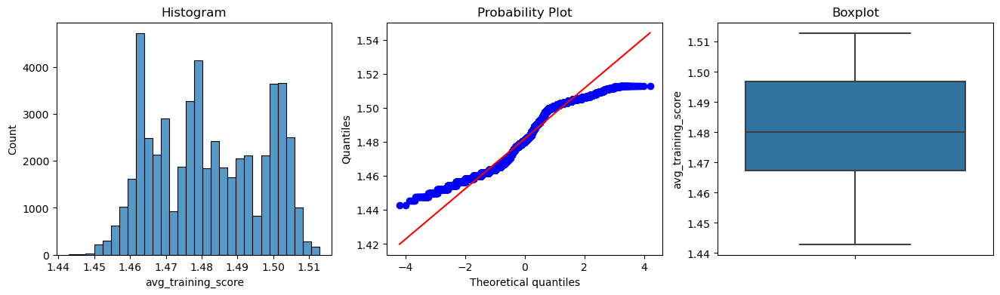

In [38]:
# using yeo-johnson transformation
# initialize the transformer with a subset of variables to transform
yjt = YeoJohnsonTransformer(variables = ['age','length_of_service', 'avg_training_score'])

# fit transformer to the dataframe
yjt.fit(hr_df)

# transform indicated variables
hr_df_yj = yjt.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_yj, 'age')
diagnostic_plots(hr_df_yj, 'length_of_service')
diagnostic_plots(hr_df_yj, 'avg_training_score')

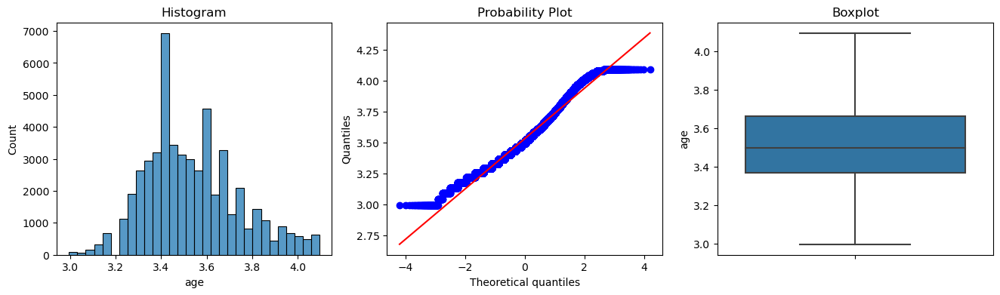

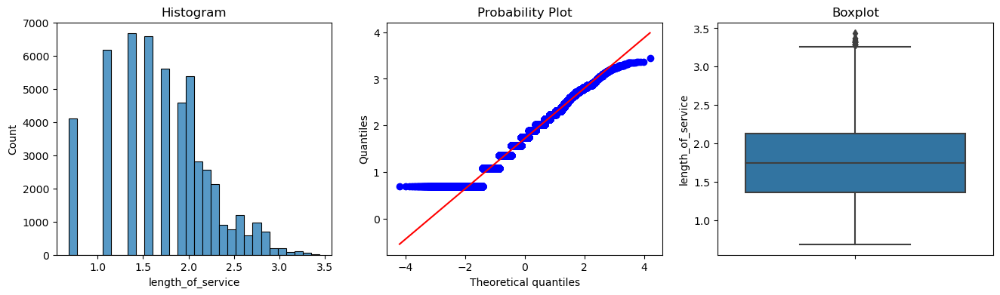

In [39]:
# Transform the variables with the suitable transformation methods
pipe = Pipeline([
    ('logarithm', LogTransformer(variables = ['age'])),    
    ('yeojohnson', YeoJohnsonTransformer(variables = ['length_of_service'])),
     ])

# fit pipeline to data 
pipe.fit(hr_df)

# transform data
hr_df_t = pipe.transform(hr_df)

# display diagnostic plots
diagnostic_plots(hr_df_t, 'age')
diagnostic_plots(hr_df_t, 'length_of_service')

### 1.2.7 Discretization

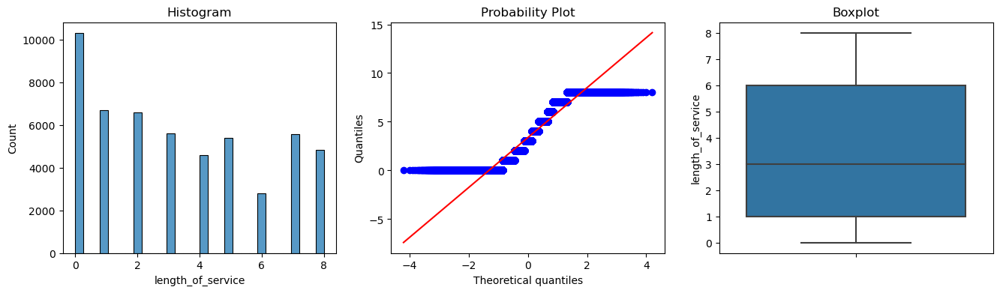

In [40]:
# Discretization
disc = EqualFrequencyDiscretiser(q=10, variables = ['length_of_service'])

disc.fit(hr_df_t)

hr_df_d = disc.transform(hr_df_t)

# display diagnostic plots
diagnostic_plots(hr_df_d, 'length_of_service')

### 1.2.8 Feature Scaling

In [41]:
# Standardisation
# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
x = ['age', 'length_of_service', 'avg_training_score', 'previous_year_rating', 'no_of_trainings']
scaler.fit(hr_df_t[x])

# transform train and test sets
hr_df_s = hr_df_t.copy()
hr_df_s[x] =  scaler.transform(hr_df_t[x])

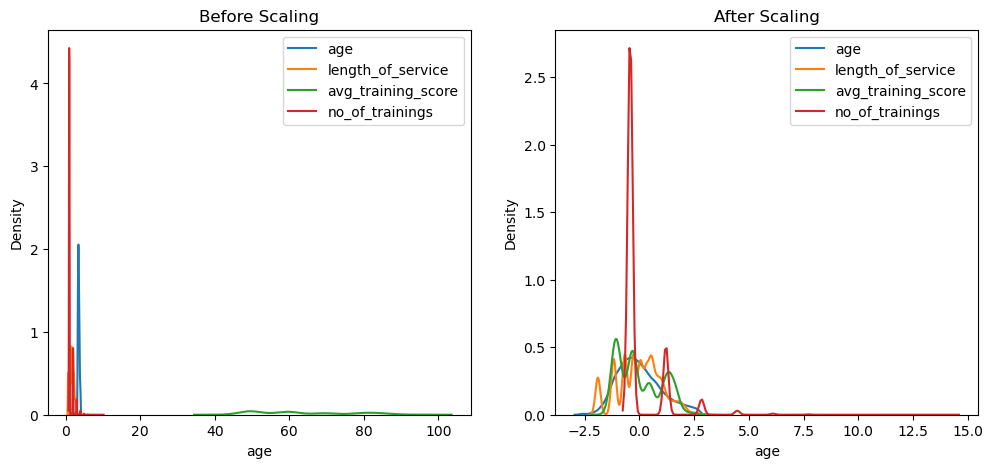

In [42]:
# Compare the variable distributions before and after scaling

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(hr_df_t['age'], ax=ax1, label ='age')
sns.kdeplot(hr_df_t['length_of_service'], ax=ax1, label ='length_of_service')
sns.kdeplot(hr_df_t['avg_training_score'], ax=ax1, label ='avg_training_score')
sns.kdeplot(hr_df_t['no_of_trainings'], ax=ax1, label ='no_of_trainings')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(hr_df_s['age'], ax=ax2, label ='age')
sns.kdeplot(hr_df_s['length_of_service'], ax=ax2, label ='length_of_service')
sns.kdeplot(hr_df_s['avg_training_score'], ax=ax2, label ='avg_training_score')
sns.kdeplot(hr_df_s['no_of_trainings'], ax=ax2, label ='no_of_trainings')
ax2.legend()
plt.show()

### 1.2.9 Categorical Encoding

In [43]:
# One-hot encoding
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True, variables= ['department', 'gender', 'recruitment_channel'])

ohe_enc.fit(hr_df_s)

hr_df_enc = ohe_enc.transform(hr_df_s)

hr_df_enc.head()

,region,education,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,department_Sales & Marketing,department_Operations,department_Technology,department_Analytics,department_R&D,department_Procurement,department_Finance,department_HR,gender_f,recruitment_channel_sourcing,recruitment_channel_other
0,region_7,Master's & above,-0.417644,0.109025,1.279209,0.745036,1,0,-1.099974,0,1,0,0,0,0,0,0,0,1,1,0
1,region_22,Bachelor's,-0.417644,-0.640591,1.279209,-0.270179,0,0,-0.272768,0,0,1,0,0,0,0,0,0,0,0,1
2,region_19,Bachelor's,-0.417644,-0.031938,-0.066882,0.543091,0,0,-1.024774,0,1,0,0,0,0,0,0,0,0,1,0
3,region_23,Bachelor's,1.212457,0.635254,-1.412973,1.087391,0,0,-1.024774,0,1,0,0,0,0,0,0,0,0,0,1
4,region_26,Bachelor's,-0.417644,1.331135,-0.066882,-1.167709,0,0,0.704839,0,0,0,1,0,0,0,0,0,0,0,1


In [44]:
# Ordinal encoding
hr_df_enc['education'].unique()

array(["Master's & above", "Bachelor's", 'Below Secondary'], dtype=object)

In [45]:
# Map values to the labels
edu_labels = ["Below Secondary", "Bachelor's", "Master's & above"]

ordinal_mapping = {k: i for i, k in enumerate(edu_labels, 0)}
ordinal_mapping

{'Below Secondary': 0, "Bachelor's": 1, "Master's & above": 2}

In [46]:
# Replace the labels with the ordered numbers
hr_df_enc['education'] = hr_df_enc['education'].map(ordinal_mapping)

In [47]:
# Encoding using frequency of observations
hr_df_enc['region'].value_counts()

region_2     11497
other         7462
region_22     6108
region_7      4624
region_15     2617
region_13     2592
region_26     2160
region_31     1841
region_4      1701
region_27     1575
region_16     1410
region_11     1291
region_28     1234
region_23     1147
region_29      975
region_19      864
region_32      861
region_20      849
region_14      804
region_17      787
Name: region, dtype: int64

In [48]:
count_enc = CountFrequencyEncoder(
    encoding_method='frequency',
    variables=['region'])

count_enc.fit(hr_df_enc)

hr_df_enc = count_enc.transform(hr_df_enc)

In [49]:
hr_df_enc.head()

,region,education,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,department_Sales & Marketing,department_Operations,department_Technology,department_Analytics,department_R&D,department_Procurement,department_Finance,department_HR,gender_f,recruitment_channel_sourcing,recruitment_channel_other
0,0.088246,2,-0.417644,0.109025,1.279209,0.745036,1,0,-1.099974,0,1,0,0,0,0,0,0,0,1,1,0
1,0.116567,1,-0.417644,-0.640591,1.279209,-0.270179,0,0,-0.272768,0,0,1,0,0,0,0,0,0,0,0,1
2,0.016489,1,-0.417644,-0.031938,-0.066882,0.543091,0,0,-1.024774,0,1,0,0,0,0,0,0,0,0,1,0
3,0.021890,1,1.212457,0.635254,-1.412973,1.087391,0,0,-1.024774,0,1,0,0,0,0,0,0,0,0,0,1
4,0.041222,1,-0.417644,1.331135,-0.066882,-1.167709,0,0,0.704839,0,0,0,1,0,0,0,0,0,0,0,1


### 1.3 Correlation Analysis
### 1.3.1 Pearson Correlation of Features

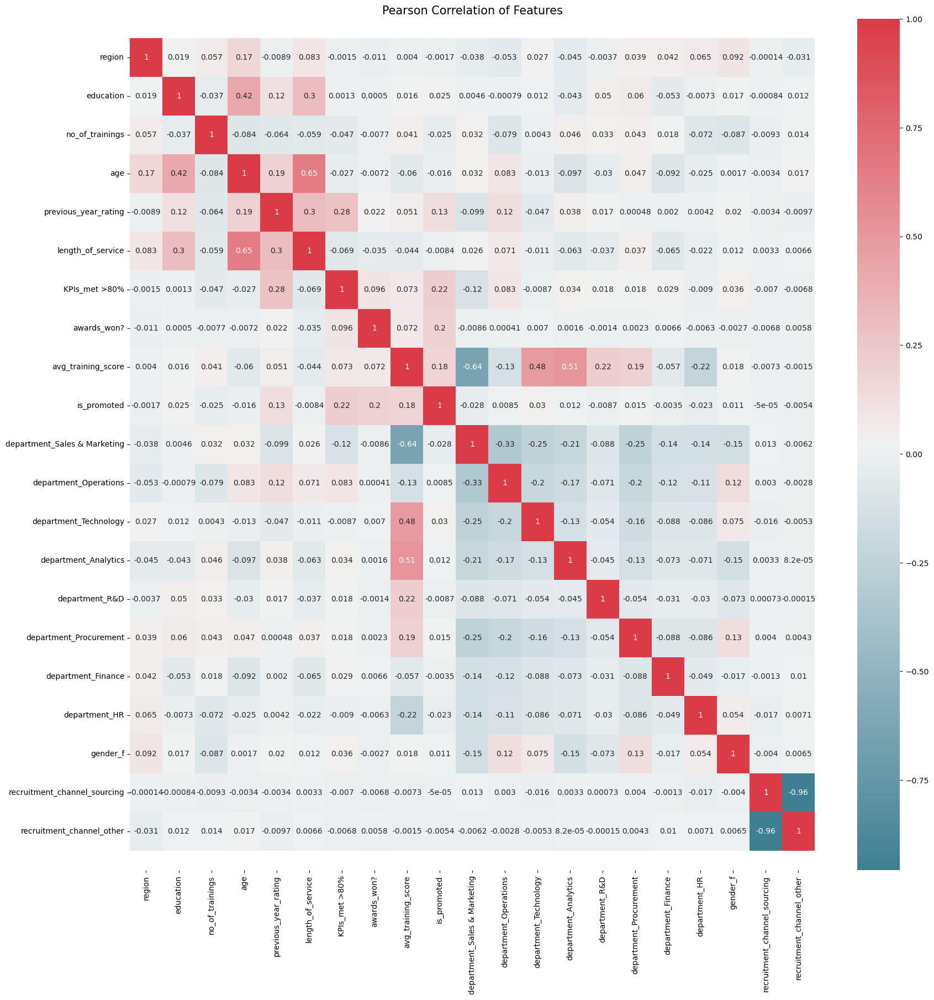

In [50]:
# Heatmap: the correlation between any two features/variables
cmap = sns.diverging_palette(220, 10, as_cmap=True)
plt.figure(figsize=(20,20))
plt.title('Pearson Correlation of Features', size=15)
ax = sns.heatmap(hr_df_enc.astype(float).corr(), cmap=cmap, annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

### 1.3.2 Feature Adding

In [51]:
# Polynomial Expansion
# set up the polynomial expansion transformer
poly = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)

# train the polynomial expansion transformer
poly.fit(hr_df_enc[['previous_year_rating','KPIs_met >80%','awards_won?','avg_training_score']])

# create new features
new_features = poly.transform(hr_df_enc[['previous_year_rating','KPIs_met >80%','awards_won?','avg_training_score']])

poly.get_feature_names_out(['previous_year_rating','KPIs_met >80%','awards_won?','avg_training_score'])

array(['previous_year_rating', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'previous_year_rating^2',
       'previous_year_rating KPIs_met >80%',
       'previous_year_rating awards_won?',
       'previous_year_rating avg_training_score', 'KPIs_met >80%^2',
       'KPIs_met >80% awards_won?', 'KPIs_met >80% avg_training_score',
       'awards_won?^2', 'awards_won? avg_training_score',
       'avg_training_score^2', 'previous_year_rating^3',
       'previous_year_rating^2 KPIs_met >80%',
       'previous_year_rating^2 awards_won?',
       'previous_year_rating^2 avg_training_score',
       'previous_year_rating KPIs_met >80%^2',
       'previous_year_rating KPIs_met >80% awards_won?',
       'previous_year_rating KPIs_met >80% avg_training_score',
       'previous_year_rating awards_won?^2',
       'previous_year_rating awards_won? avg_training_score',
       'previous_year_rating avg_training_score^2', 'KPIs_met >80%^3',
       'KPIs_met >80%^2 awards_won?',
       'KP

In [52]:
# capture the returned features in a dataframe
new_features = pd.DataFrame(new_features)

# add column names of created features
new_features.columns = poly.get_feature_names_out(['previous_year_rating','KPIs_met >80%','awards_won?','avg_training_score'])

In [53]:
# reset index of main dataframe
hr_df_enc.reset_index(drop=True,inplace =True)

#add new features to dataframe
hr_df_poly = pd.concat([hr_df_enc,new_features], axis=1)

In [54]:
hr_df_enc.shape, new_features.shape, hr_df_poly.shape

((52399, 21), (52399, 34), (52399, 55))

In [55]:
# Calculate correlations with the target variable
correlations = hr_df_poly.corr()['is_promoted'].abs()

# Drop columns where absolute correlation with the target is less than 0.01
columns_to_drop = correlations[correlations < 0.01].index
hr_df_poly.drop(columns=columns_to_drop, inplace=True)
hr_df_poly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52399 entries, 0 to 52398
Data columns (total 48 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   education                                              52399 non-null  int64  
 1   no_of_trainings                                        52399 non-null  float64
 2   age                                                    52399 non-null  float64
 3   previous_year_rating                                   52399 non-null  float64
 4   KPIs_met >80%                                          52399 non-null  int64  
 5   awards_won?                                            52399 non-null  int64  
 6   avg_training_score                                     52399 non-null  float64
 7   is_promoted                                            52399 non-null  int64  
 8   department_Sales & Marketing                  

### 1.3.3 Sample the Data

In [56]:
# Stratified sampling
# Split data according to 0 and 1 in is_promoted
hr_df_1 = hr_df_poly[hr_df_poly['is_promoted'] == 1]
hr_df_0 = hr_df_poly[hr_df_poly['is_promoted'] == 0]

len(hr_df_1)

4546

In [57]:
# Sampling of hr_df_0
hr_df_0_sampled = hr_df_0.sample(n=len(hr_df_1), random_state=2).copy()
hr_df_0_sampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4546 entries, 29725 to 835
Data columns (total 48 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   education                                              4546 non-null   int64  
 1   no_of_trainings                                        4546 non-null   float64
 2   age                                                    4546 non-null   float64
 3   previous_year_rating                                   4546 non-null   float64
 4   KPIs_met >80%                                          4546 non-null   int64  
 5   awards_won?                                            4546 non-null   int64  
 6   avg_training_score                                     4546 non-null   float64
 7   is_promoted                                            4546 non-null   int64  
 8   department_Sales & Marketing                 

In [58]:
# Create new dataframe
final_hr_df=pd.concat([hr_df_1,hr_df_0_sampled],axis=0)
final_hr_df['is_promoted'].value_counts()

1    4546
0    4546
Name: is_promoted, dtype: int64

### 1.4 Export the Data

In [59]:
# Export to csv
final_hr_df.to_csv('hr_data_new.csv')

## 2. Airbnb

### 2.1 Load and Explore the data

In [60]:
# Load data
ab_df = pd.read_csv('listings.csv')

In [61]:
# Display first five rows of ab_df
ab_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [62]:
# Info of ab_df
ab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [63]:
# Number of rows and columns in ab_df
ab_df.shape

(7907, 16)

In [64]:
# Split into numerical and categorical variables
cat_cols = [c for c in ab_df.columns if ab_df[c].dtypes=='O']
print(cat_cols)

num_cols = [n for n in ab_df.columns if ab_df[n].dtypes!='O']
print(num_cols)

['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review']
['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']


In [65]:
# Categorical data
ab_df[cat_cols].describe()

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,7905,7907,7907,7907,7907,5149
unique,7457,1833,5,43,3,1001
top,Luxury hostel with in-cabin locker - Single mixed,Jay,Central Region,Kallang,Entire home/apt,2019-08-12
freq,13,290,6309,1043,4132,152


In [66]:
# Create new dataframe to focus on Central Region
cr_df = ab_df[ab_df['neighbourhood_group'] == 'Central Region']
cr_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
10,275343,Conveniently located City Room!( (Phone number...,1439258,K2 Guesthouse,Central Region,Bukit Merah,1.28875,103.80814,Private room,44,15,18,2019-04-21,0.23,32,331
11,275344,15 mins to Outram MRT Single Room (B),1439258,K2 Guesthouse,Central Region,Bukit Merah,1.28837,103.81099,Private room,40,30,10,2018-09-13,0.11,32,276
13,294281,5 mins walk from Newton subway,1521514,Elizabeth,Central Region,Newton,1.31125,103.83816,Private room,65,2,125,2019-08-22,1.35,6,336
14,324945,20 Mins to Sentosa @ Hilltop ! (8),1439258,K2 Guesthouse,Central Region,Bukit Merah,1.28976,103.80896,Private room,44,30,13,2019-02-02,0.15,32,340


In [67]:
# Info of new dataframe
cr_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6309 entries, 1 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              6309 non-null   int64  
 1   name                            6307 non-null   object 
 2   host_id                         6309 non-null   int64  
 3   host_name                       6309 non-null   object 
 4   neighbourhood_group             6309 non-null   object 
 5   neighbourhood                   6309 non-null   object 
 6   latitude                        6309 non-null   float64
 7   longitude                       6309 non-null   float64
 8   room_type                       6309 non-null   object 
 9   price                           6309 non-null   int64  
 10  minimum_nights                  6309 non-null   int64  
 11  number_of_reviews               6309 non-null   int64  
 12  last_review                     41

In [68]:
# Shape of new dataframe
cr_df.shape

(6309, 16)

In [69]:
# Univariate analyis of each categorical variable
cr_df[cat_cols].describe()

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,6307,6309,6309,6309,6309,4144
unique,5914,1272,1,20,3,861
top,Luxury hostel with in-cabin locker - Single mixed,Jay,Central Region,Kallang,Entire home/apt,2019-08-12
freq,13,248,6309,1043,3738,127


In [70]:
# Values present in each categorical variable
for c in cat_cols:
    print(f'{c} \n------------------------')
    print(cr_df[c].value_counts())
    print("\n")

name 
------------------------
Luxury hostel with in-cabin locker - Single mixed     13
Studio Apartment - Oakwood Premier                     9
Inviting & Cozy 1BR APT 3 mins from Tg Pagar MRT       9
Tasteful & Cozy 1 BR near SGH/Tiong Bahru              8
City-located 1BR loft apartment *BRAND NEW*            8
                                                      ..
Geylang Aljunied Hostel- lovely Pte room               1
Stylish & Chic, Moroccan Loft in Shophouse!:)          1
Private Master Bedroom @ Paya Lebar MRT                1
Studio Apartment - Urban Living in Orchard             1
Amazing room with private bathroom walk to Orchard     1
Name: name, Length: 5914, dtype: int64


host_name 
------------------------
Jay          248
Alvin        247
Richards     156
Aaron        143
Kaurus       112
            ... 
Siew Yin       1
Véronique      1
Susie          1
Yingying       1
Ryokuka        1
Name: host_name, Length: 1272, dtype: int64


neighbourhood_group 
-----------

In [71]:
# Univariate analyis of each numerical variable
cr_df[num_cols].describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,6.309000e+03,6.309000e+03,6309.000000,6309.000000,6309.000000,6309.000000,6309.000000,4144.000000,6309.000000,6309.000000
mean,2.411995e+07,9.267363e+07,1.303630,103.850989,176.629418,15.342844,13.037724,1.079105,47.304169,215.435727
std,1.005719e+07,8.376708e+07,0.016459,0.025049,293.992420,36.047130,29.313302,1.286324,67.690029,143.593737
min,5.064600e+04,2.366600e+04,1.243870,103.763270,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.660310e+07,2.114972e+07,1.290980,103.839270,81.000000,2.000000,0.000000,0.200000,3.000000,63.000000
50%,2.643067e+07,6.344891e+07,1.306000,103.849320,135.000000,3.000000,2.000000,0.580000,14.000000,269.000000
75%,3.277421e+07,1.598048e+08,1.314480,103.862200,208.000000,10.000000,11.000000,1.472500,67.000000,355.000000
max,3.811276e+07,2.885676e+08,1.365830,103.918220,10000.000000,1000.000000,307.000000,13.000000,274.000000,365.000000


In [72]:
# Values present in each numerical variable
for c in num_cols:
    print(f'{c} \n------------------------')
    print(cr_df[c].value_counts())
    print("\n")

id 
------------------------
50646       1
30799308    1
30784099    1
30783602    1
30779360    1
           ..
20449193    1
20446077    1
20442964    1
20441993    1
38112762    1
Name: id, Length: 6309, dtype: int64


host_id 
------------------------
66406177     237
8492007      202
209913841    156
29420853     140
2413412      112
            ... 
91224988       1
54285807       1
90599917       1
11782171       1
10823332       1
Name: host_id, Length: 1750, dtype: int64


latitude 
------------------------
1.31125    8
1.31137    8
1.31141    8
1.31163    7
1.28376    7
          ..
1.30814    1
1.30828    1
1.28875    1
1.27677    1
1.29672    1
Name: latitude, Length: 3673, dtype: int64


longitude 
------------------------
103.86022    7
103.85361    7
103.84667    6
103.85201    6
103.84294    6
            ..
103.84622    1
103.84617    1
103.84783    1
103.84756    1
103.83801    1
Name: longitude, Length: 4058, dtype: int64


price 
------------------------
200     157

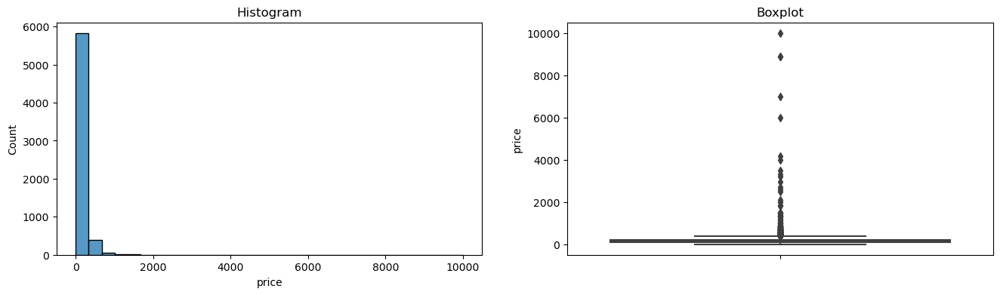

In [73]:
# Univariate analysis of target variable -- price
# define figure size
plt.figure(figsize=(16, 4))

# histogram
plt.subplot(1, 2, 1)
sns.histplot(cr_df['price'], bins=30)
plt.title('Histogram')

# boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=cr_df['price'])
plt.title('Boxplot')

plt.show()

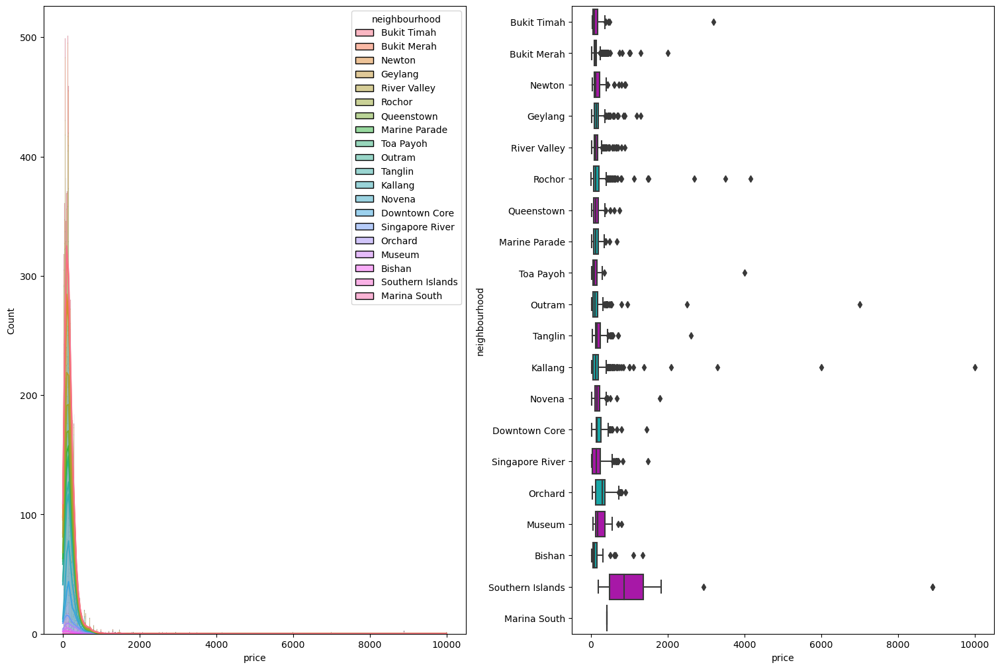

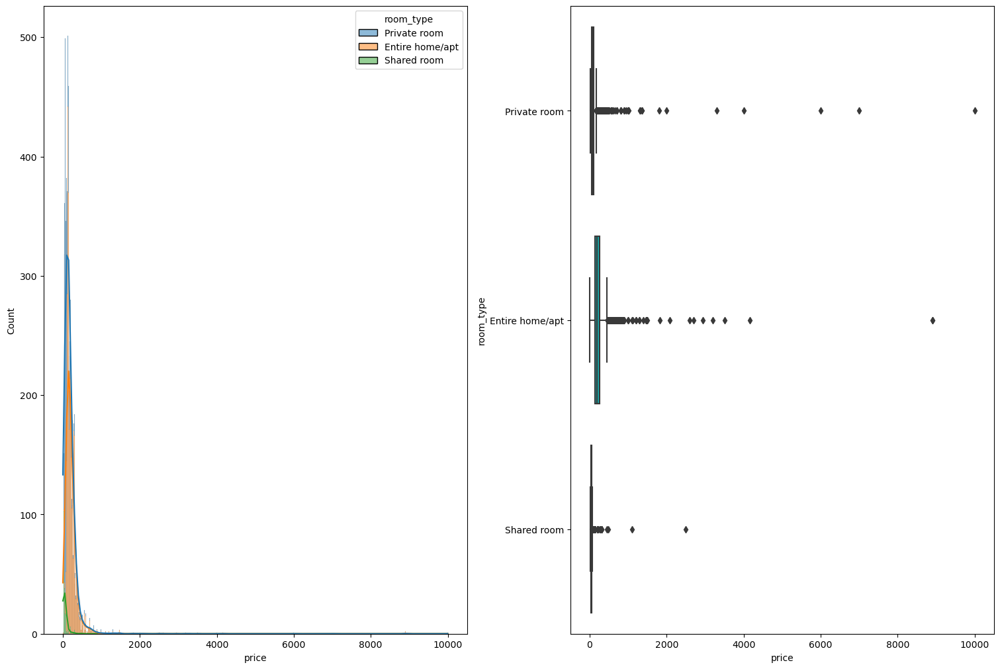

In [74]:
# Bivariate Analysis
# Categorical Variables vs Target
for c in ['neighbourhood','room_type']:
    fig, ax = plt.subplots(1,2, figsize=(15,10), constrained_layout=True)
    ax1= sns.histplot(data=cr_df, x="price", hue=c, multiple="stack",kde=True,ax=ax[0])
    ax2= sns.boxplot(x=cr_df['price'],y=cr_df[c],palette=['m','c'],ax=ax[1])
    plt.show()

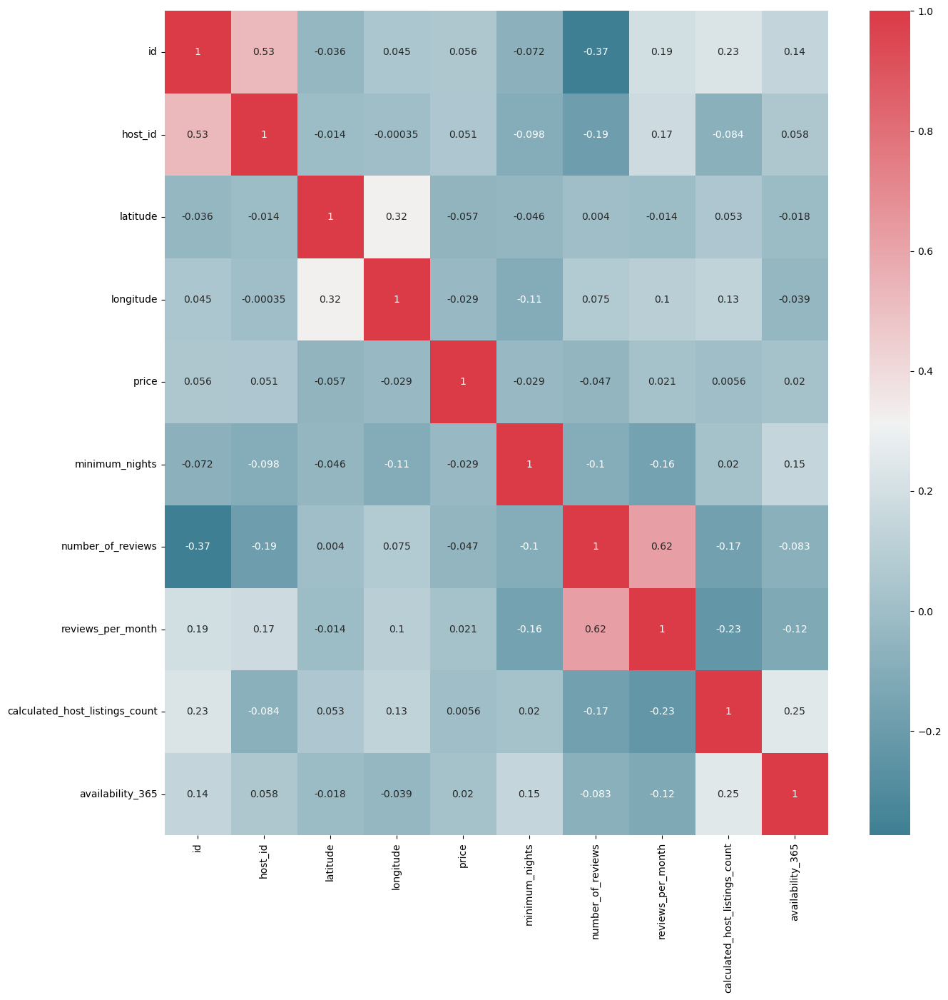

In [75]:
# Numerical Variables vs Target
plt.figure(figsize=(15,15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ax = sns.heatmap(cr_df.corr(), cmap=cmap, annot =True)
plt.show()

In [76]:
# Multivariate analysis
# Create a scattermapbox plot
fig = px.scatter_mapbox(cr_df, lat='latitude', lon='longitude', hover_name='neighbourhood', zoom=10, color = 'price')

# Customize map layout
fig.update_layout(
    mapbox_style='carto-positron', # Set the map style
    mapbox_zoom=10, # Set initial zoom level
    mapbox_center={'lat': cr_df['latitude'].mean(), 'lon': cr_df['longitude'].mean()}, # Set the center of the map
    margin=dict(r=0, l=0, t=0, b=0) # Set margins
)

# Show the interactive map
fig.show()

### 2.2 Cleanse and Transform the data

### 2.2.1 Quantifying Missing Data

In [77]:
# Number of missing values in each column
cr_df.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2165
reviews_per_month                 2165
calculated_host_listings_count       0
availability_365                     0
dtype: int64

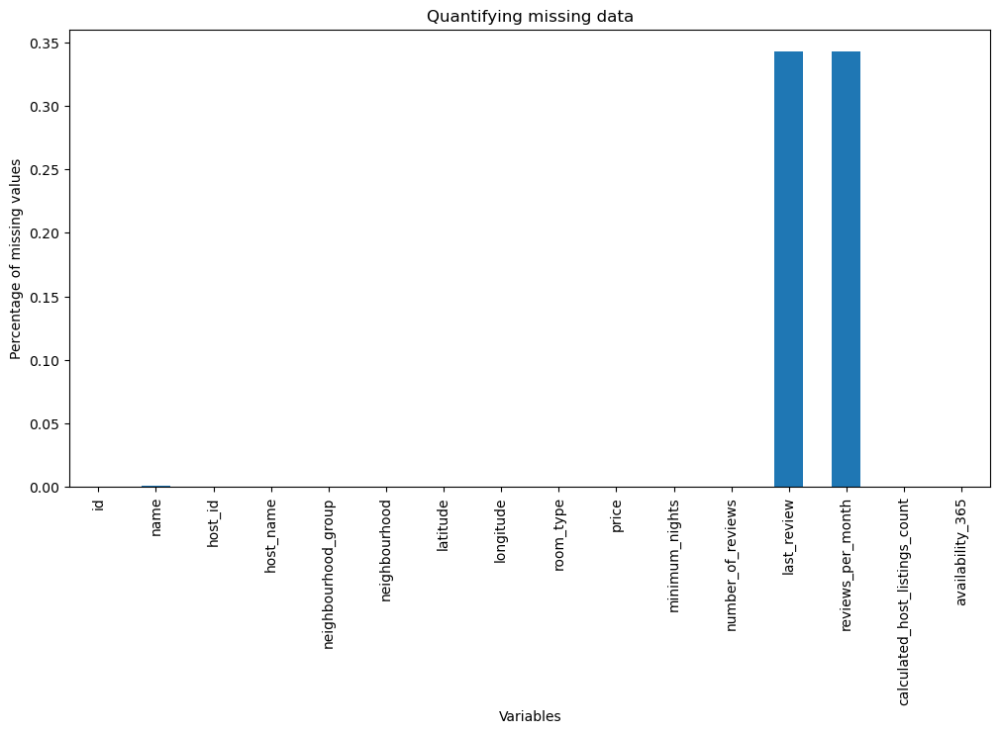

In [78]:
# Percentage of missing values
cr_df.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')
plt.show()

### 2.2.2 Handling Missing Values

In [79]:
# Drop rows with missing values
cr_df.dropna(subset = ['name'], inplace=True)

In [80]:
cr_df.loc[cr_df['last_review'].isnull() & cr_df['reviews_per_month'].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
18,355955,Double room in an Authentic Peranakan Shophouse,1759905,Aresha,Central Region,Geylang,1.31420,103.90232,Private room,81,90,0,NaN,NaN,1,173
26,642660,BEST CITY LIVING WITH GA RESIDENCE,3212572,Roger,Central Region,Rochor,1.30109,103.85234,Private room,167,180,0,NaN,NaN,1,365
28,719944,HDB housing in prime area near town,3648224,Audrey,Central Region,Queenstown,1.30901,103.79639,Shared room,208,1,0,NaN,NaN,1,0
37,782227,"Cosy, bright, tasefully furnished",4125828,Jenny,Central Region,Queenstown,1.28342,103.78585,Private room,128,3,0,NaN,NaN,1,365
46,880846,1 bedrm Aptm by Farrer Park Mrt,4659563,Gin,Central Region,Kallang,1.31357,103.85731,Private room,100,365,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30


In [81]:
# Replace missing values
cr_df['reviews_per_month'].fillna(0, inplace=True)
cr_df['last_review'].fillna('0000-00-00',inplace = True)
cr_df.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [82]:
# Split last_review into day, month and year
cr_df[['year','month', 'day' ]] = cr_df['last_review'].str.split('-', expand = True)

In [83]:
# Replace 00 in month and 0000 in year with null to do random sample imputation
cr_df['year'].replace('0000', np.nan, inplace = True)
cr_df['month'].replace('00', np.nan, inplace = True)
cr_df.loc[cr_df['month'].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day
18,355955,Double room in an Authentic Peranakan Shophouse,1759905,Aresha,Central Region,Geylang,1.31420,103.90232,Private room,81,90,0,0000-00-00,0.0,1,173,NaN,NaN,00
26,642660,BEST CITY LIVING WITH GA RESIDENCE,3212572,Roger,Central Region,Rochor,1.30109,103.85234,Private room,167,180,0,0000-00-00,0.0,1,365,NaN,NaN,00
28,719944,HDB housing in prime area near town,3648224,Audrey,Central Region,Queenstown,1.30901,103.79639,Shared room,208,1,0,0000-00-00,0.0,1,0,NaN,NaN,00
37,782227,"Cosy, bright, tasefully furnished",4125828,Jenny,Central Region,Queenstown,1.28342,103.78585,Private room,128,3,0,0000-00-00,0.0,1,365,NaN,NaN,00
46,880846,1 bedrm Aptm by Farrer Park Mrt,4659563,Gin,Central Region,Kallang,1.31357,103.85731,Private room,100,365,0,0000-00-00,0.0,1,365,NaN,NaN,00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,0000-00-00,0.0,31,61,NaN,NaN,00
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,0000-00-00,0.0,34,365,NaN,NaN,00
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,0000-00-00,0.0,3,173,NaN,NaN,00
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,0000-00-00,0.0,2,30,NaN,NaN,00


In [84]:
# Random Sample Imputation
imputer = RandomSampleImputer(variables = ['month', 'year'])

imputer.fit(cr_df)

cr_df = imputer.transform(cr_df)

cr_df.loc[cr_df['day'] == '00']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day
18,355955,Double room in an Authentic Peranakan Shophouse,1759905,Aresha,Central Region,Geylang,1.31420,103.90232,Private room,81,90,0,0000-00-00,0.0,1,173,2019,11,00
26,642660,BEST CITY LIVING WITH GA RESIDENCE,3212572,Roger,Central Region,Rochor,1.30109,103.85234,Private room,167,180,0,0000-00-00,0.0,1,365,2019,07,00
28,719944,HDB housing in prime area near town,3648224,Audrey,Central Region,Queenstown,1.30901,103.79639,Shared room,208,1,0,0000-00-00,0.0,1,0,2019,01,00
37,782227,"Cosy, bright, tasefully furnished",4125828,Jenny,Central Region,Queenstown,1.28342,103.78585,Private room,128,3,0,0000-00-00,0.0,1,365,2019,08,00
46,880846,1 bedrm Aptm by Farrer Park Mrt,4659563,Gin,Central Region,Kallang,1.31357,103.85731,Private room,100,365,0,0000-00-00,0.0,1,365,2019,07,00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,0000-00-00,0.0,31,61,2019,07,00
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,0000-00-00,0.0,34,365,2019,08,00
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,0000-00-00,0.0,3,173,2018,10,00
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,0000-00-00,0.0,2,30,2019,08,00


In [85]:
# Change data type
cr_df[['month', 'year']] = cr_df[['month', 'year']].astype('int')

### 2.2.3 Determine Cardinality

In [86]:
cr_df.nunique()

id                                6307
name                              5914
host_id                           1748
host_name                         1271
neighbourhood_group                  1
neighbourhood                       20
latitude                          3672
longitude                         4058
room_type                            3
price                              364
minimum_nights                      64
number_of_reviews                  196
last_review                        861
reviews_per_month                  511
calculated_host_listings_count      54
availability_365                   354
year                                 6
month                               12
day                                 32
dtype: int64

In [87]:
# Drop columns
cr_df.drop(columns=['id', 'host_name', 'last_review','day','neighbourhood_group'], inplace = True)

### 2.2.4 Identifying Rare Categories

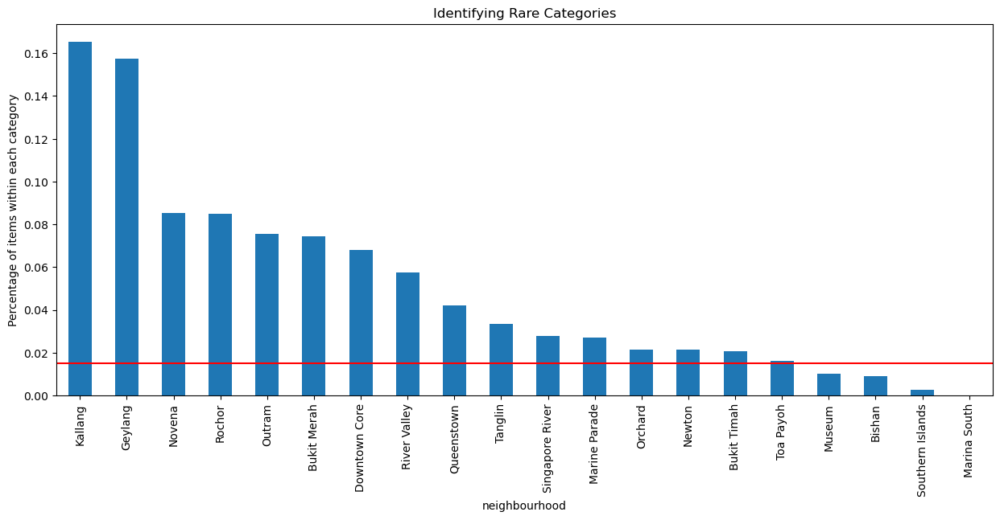

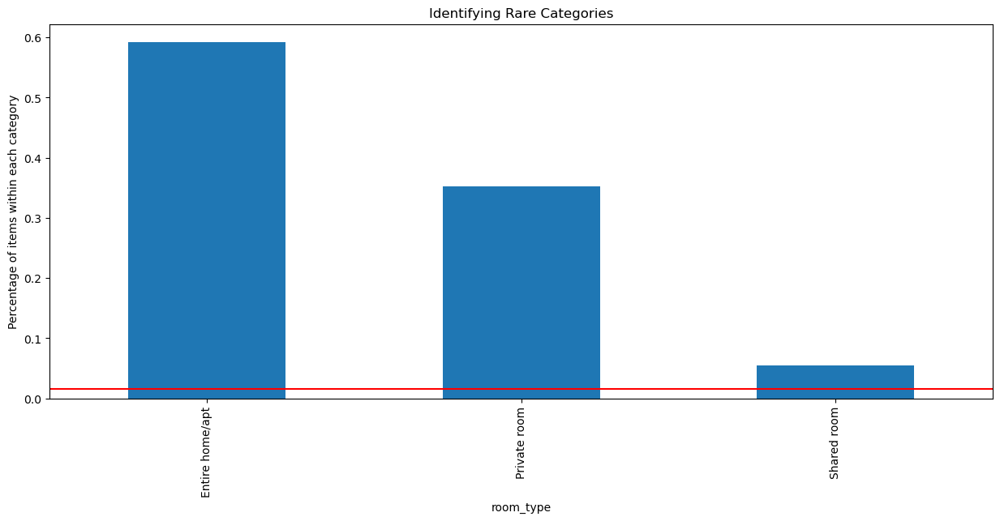

In [88]:
# Identifying rare categories

cat_cols = ['neighbourhood', 'room_type']

total_item = len(cr_df)

def rare_cat_plots(df, variable):
    label_freq = df[variable].value_counts() / total_item
    
    plt.figure(figsize=(15,6))
    
    fig = label_freq.sort_values(ascending=False).plot.bar()

    # Add a line to signal % frequency limit under which we will consider a category as rare
    fig.axhline(y=0.015, color='red')

    fig.set_ylabel('Percentage of items within each category')
    fig.set_xlabel(f'{variable}')
    fig.set_title('Identifying Rare Categories')
    plt.show()        
    
for c in cat_cols:
    rare_cat_plots(cr_df,c)

In [89]:
# Regroup rare categories in neighbourhood
label_freq = cr_df['neighbourhood'].value_counts() / total_item
    
# Identify rare categories based on the threshold
rare_categories = label_freq[label_freq < 0.015].index.tolist()

cr_df['neighbourhood'] = cr_df['neighbourhood'].apply(lambda x: 'Others' if x in rare_categories else x)

# Display categories in neighbourhood
cr_df['neighbourhood'].value_counts()

Kallang            1043
Geylang             994
Novena              537
Rochor              536
Outram              477
Bukit Merah         469
Downtown Core       428
River Valley        362
Queenstown          266
Tanglin             210
Singapore River     175
Marine Parade       171
Others              137
Orchard             136
Newton              134
Bukit Timah         131
Toa Payoh           101
Name: neighbourhood, dtype: int64

### 2.2.5 Check for Variable Distribution & Outliers

In [90]:
# Diagnostic plots
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

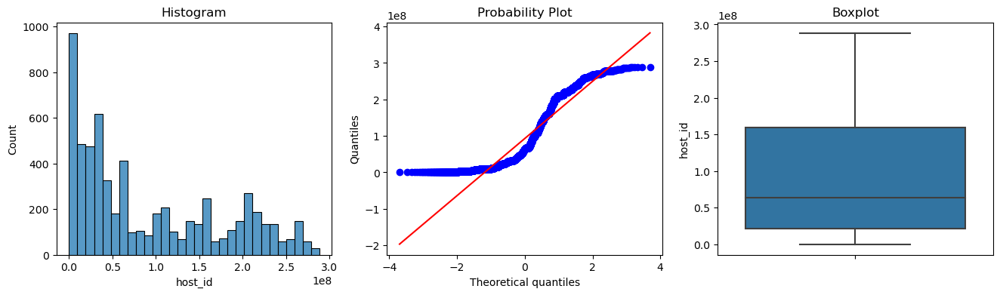

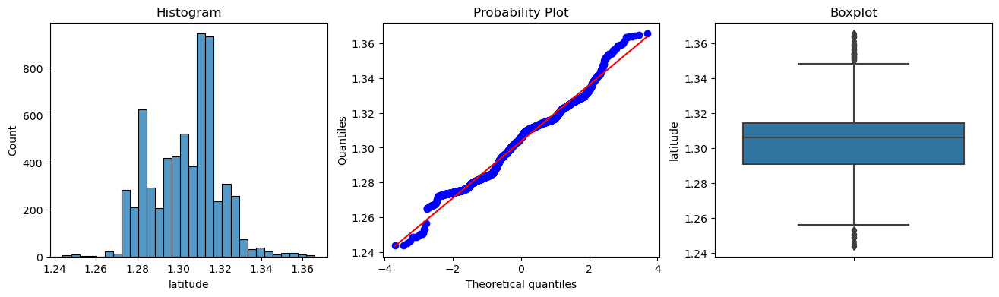

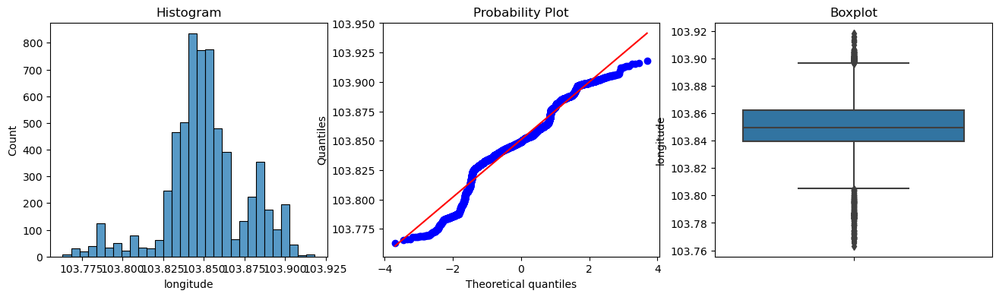

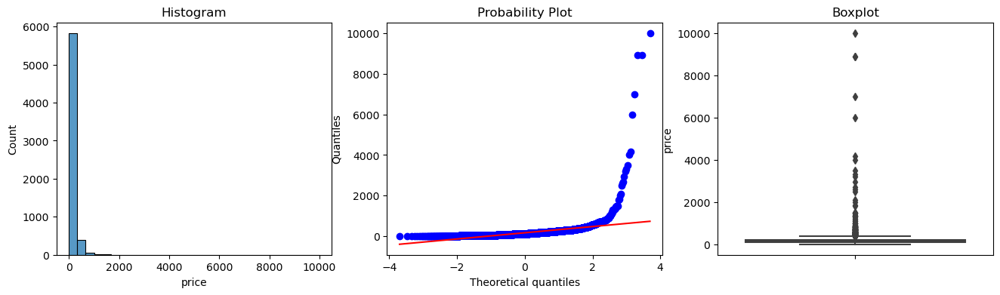

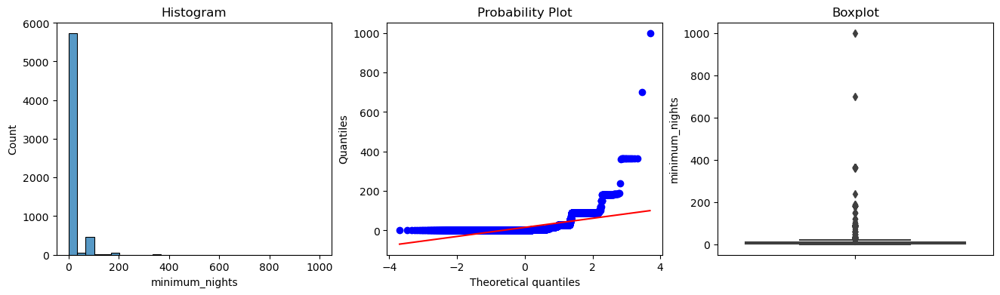

...

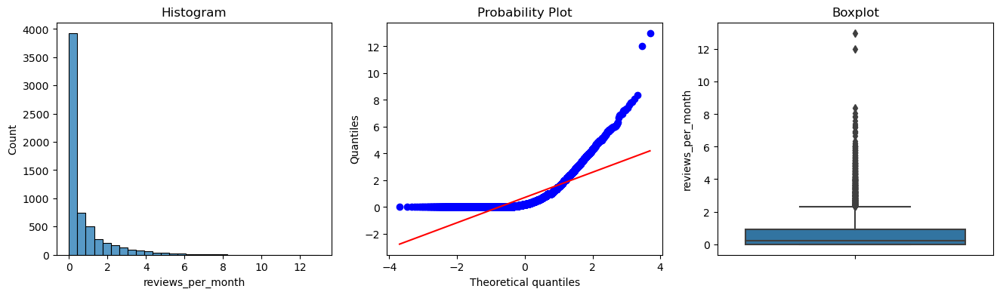

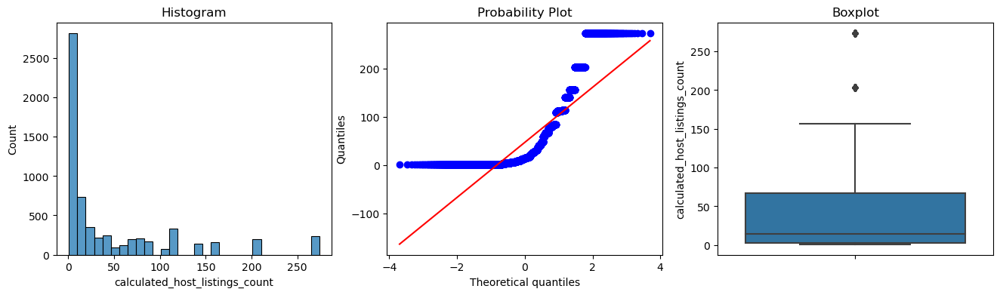

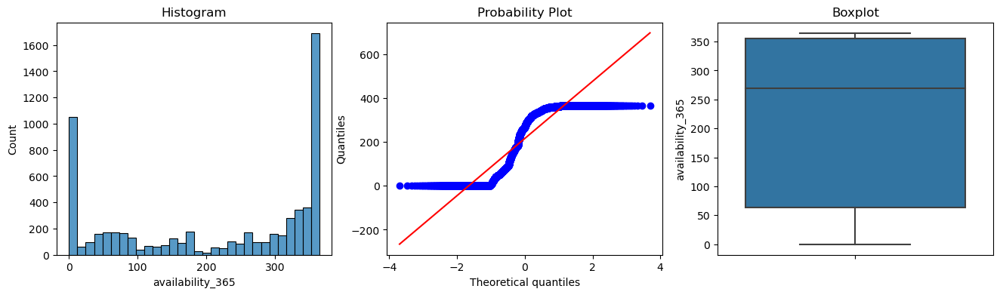

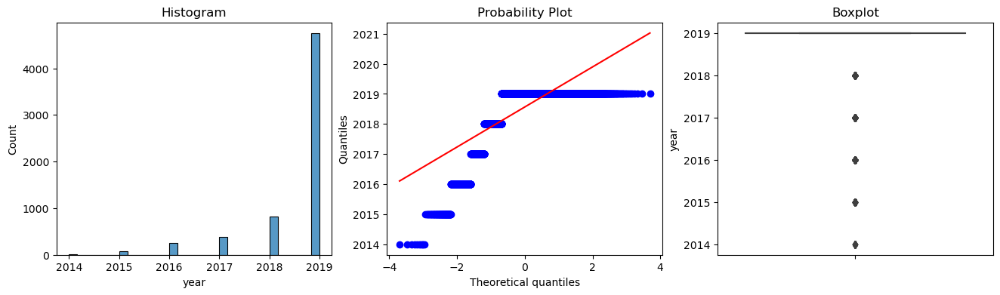

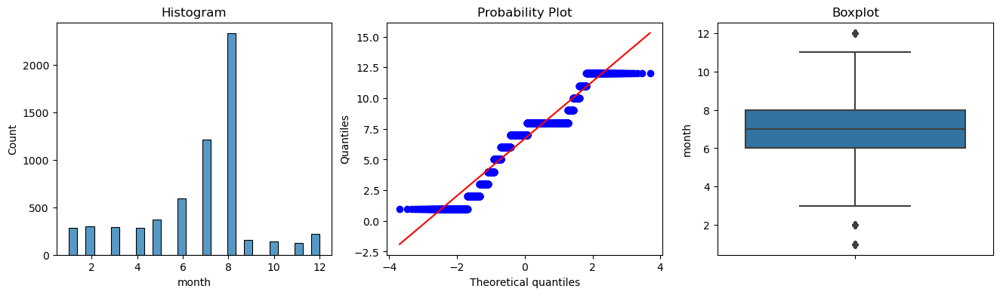

In [91]:
num_cols = [n for n in cr_df.columns if cr_df[n].dtypes!='O']

for n in num_cols:
    diagnostic_plots(cr_df, n)

### 2.2.6 Handling Outliers

In [92]:
cr_df.loc[cr_df['price']==10000]

,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month
5823,Testing,20307016,Kallang,1.2961,103.86613,Private room,10000,1,0,0.0,1,0,2019,7


In [93]:
cr_df.loc[cr_df['name'].str.contains('test', case=False, na=False)]

,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month
3555,[Test] Cozy Modern House with Unique Architecture,56183032,Outram,1.27998,103.84744,Entire home/apt,314,30,0,0.0,1,0,2019,8
5823,Testing,20307016,Kallang,1.29610,103.86613,Private room,10000,1,0,0.0,1,0,2019,7


In [94]:
cr_df.drop(cr_df[cr_df['name'].str.contains('test', case=False, na=False)].index, inplace = True)

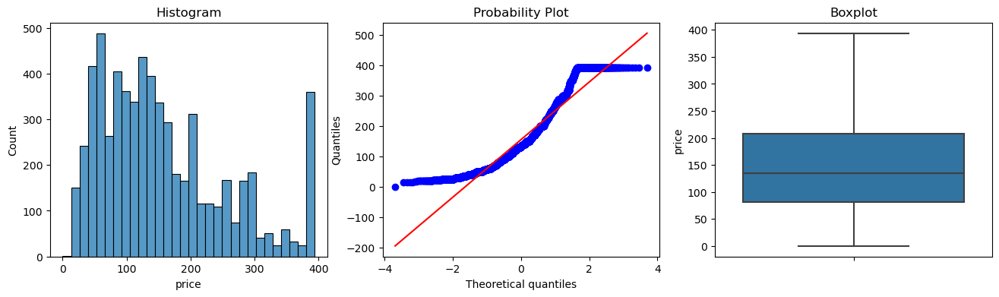

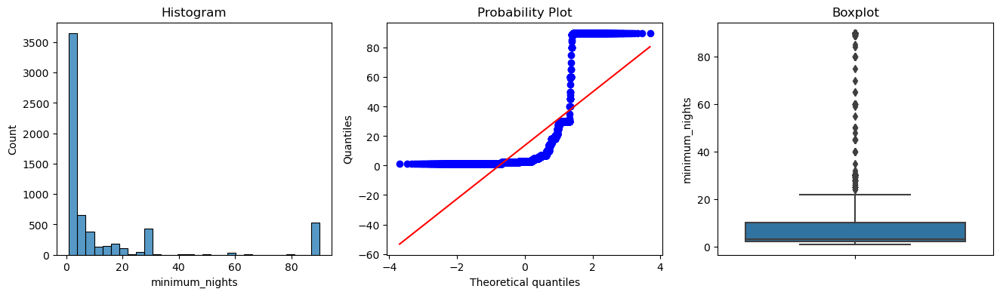

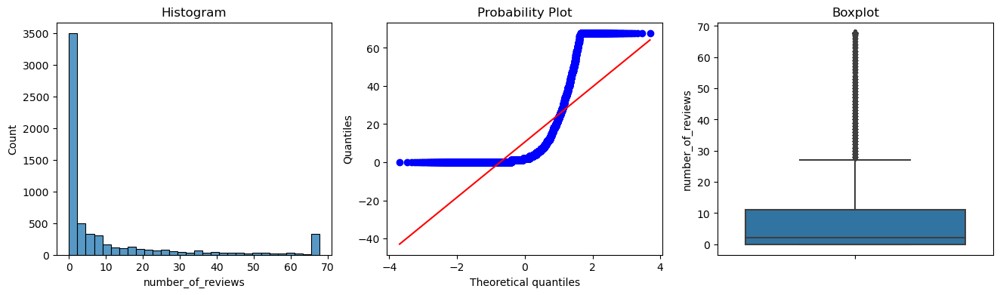

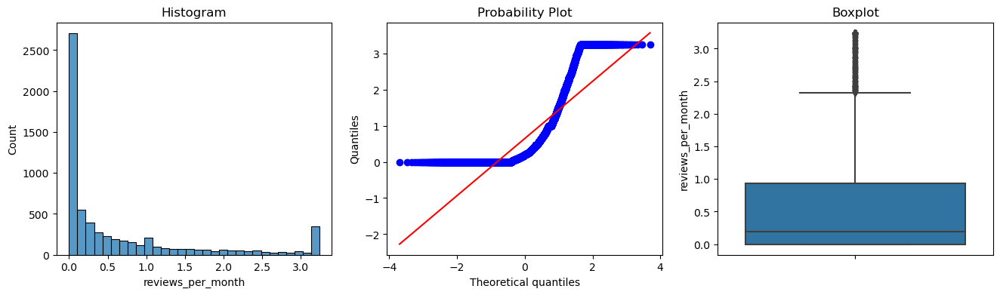

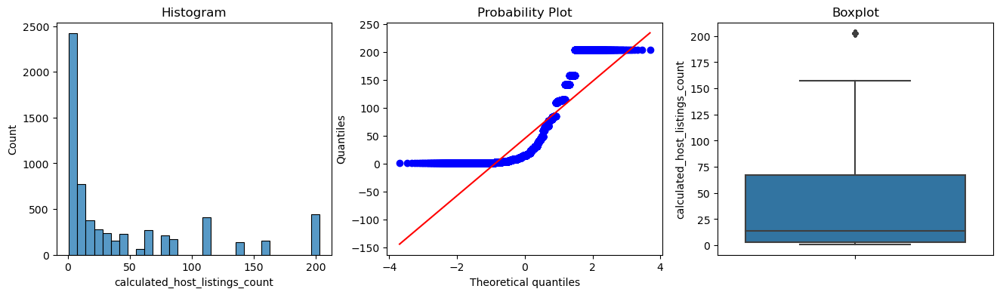

In [95]:
# Winsorisation of target -- price and left-skewed variables
windsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='right', 
                        fold =0.05,
                        variables=['price','minimum_nights', 'number_of_reviews', 'reviews_per_month',
                                  'calculated_host_listings_count'])

windsorizer.fit(cr_df)
cr_df_w = windsorizer.transform(cr_df)

for n in ['price','minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count']:
    diagnostic_plots(cr_df_w, n) 

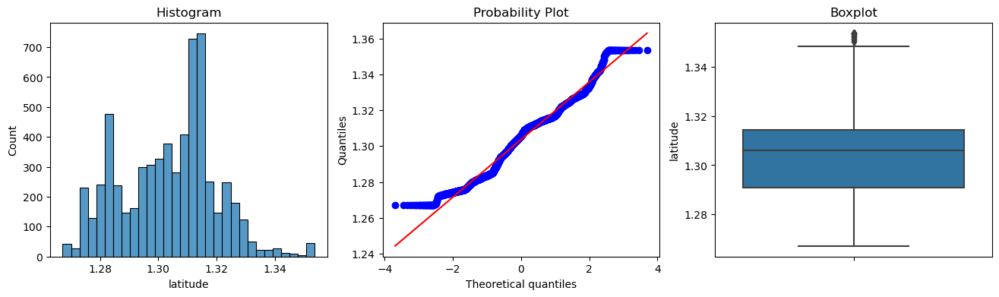

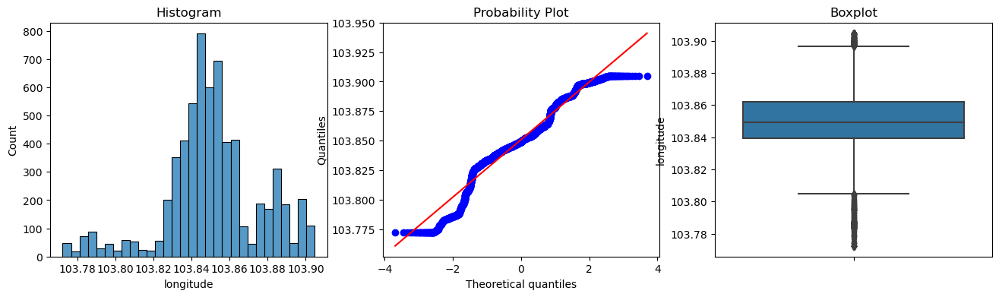

In [96]:
# Winsorisation of normally distributed variables
windsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='both', 
                        fold =0.005,
                        variables=['latitude', 'longitude'])

windsorizer.fit(cr_df_w)
cr_df_w = windsorizer.transform(cr_df_w)

for n in ['latitude', 'longitude']:
    diagnostic_plots(cr_df_w, n) 

### 2.2.7 Discretization

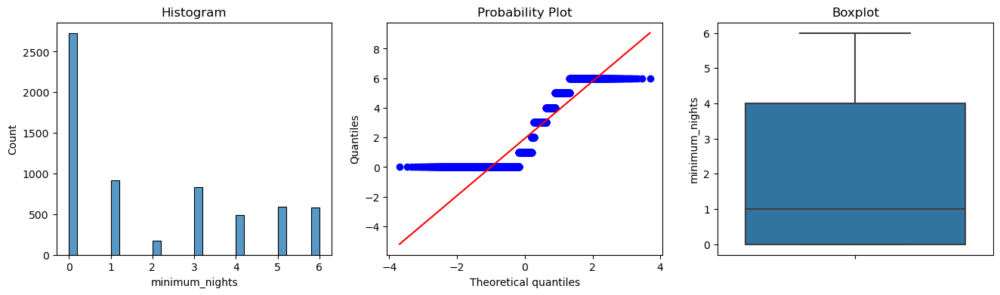

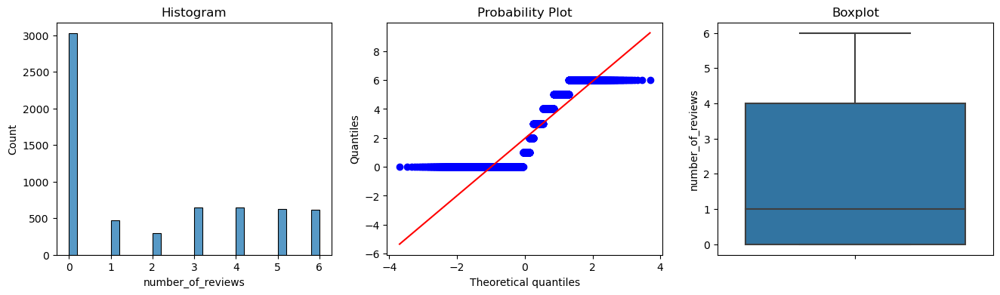

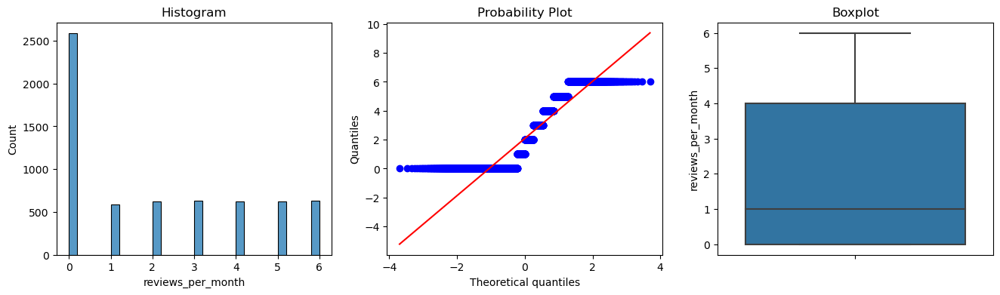

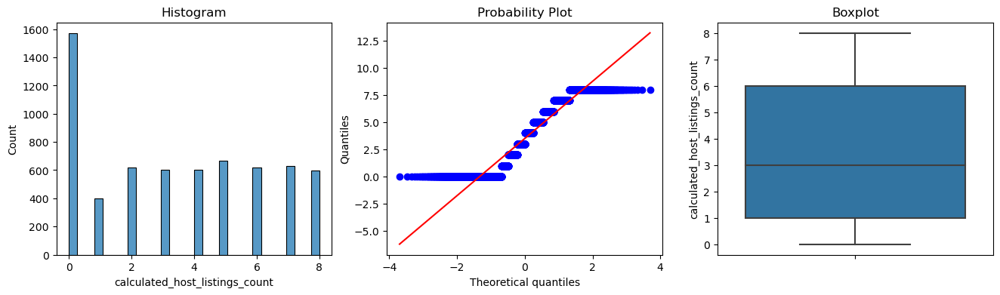

In [97]:
# Discretization

disc = EqualFrequencyDiscretiser(q=10, variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month',
                                  'calculated_host_listings_count'])

disc.fit(cr_df_w)

cr_df_d = disc.transform(cr_df_w)

for n in ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count']:
    diagnostic_plots(cr_df_d, n) 

### 2.2.8 Numerical Transformation

In [98]:
# using log transformation
# initialize the transformer
#lt = LogTransformer(variables=['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'])

# fit transformer to data set
#lt.fit(cr_df_w)

# transform variables within our data set
#cr_df_log = lt.transform(cr_df_w)

# display diagnostic plots
#diagnostic_plots(cr_df_log, 'minimum_nights')
#diagnostic_plots(cr_df_log, 'number_of_reviews')
#diagnostic_plots(cr_df_log, 'reviews_per_month')
#diagnostic_plots(cr_df_log, 'calculated_host_listings_count')

In [99]:
# using reciprocal transformation
# initialize the transformer
#rt = ReciprocalTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'])

# fit transformer to the entire dataframe
#rt.fit(cr_df_w)

# transform the indicated variables within our data set
#cr_df_rec = rt.transform(cr_df_w)

# display diagnostic plots
#diagnostic_plots(cr_df_rec, 'minimum_nights')
#diagnostic_plots(cr_df_rec, 'number_of_reviews')
#diagnostic_plots(cr_df_rec, 'reviews_per_month')
#diagnostic_plots(cr_df_rec, 'calculated_host_listings_count')

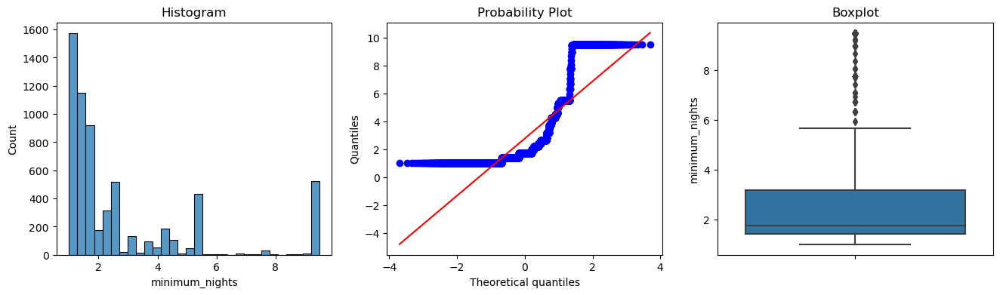

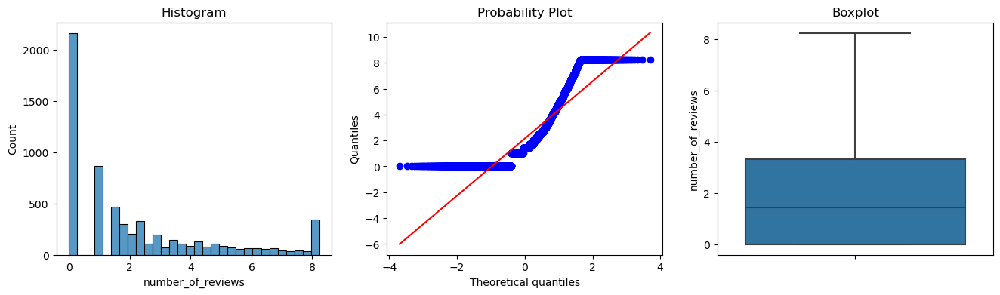

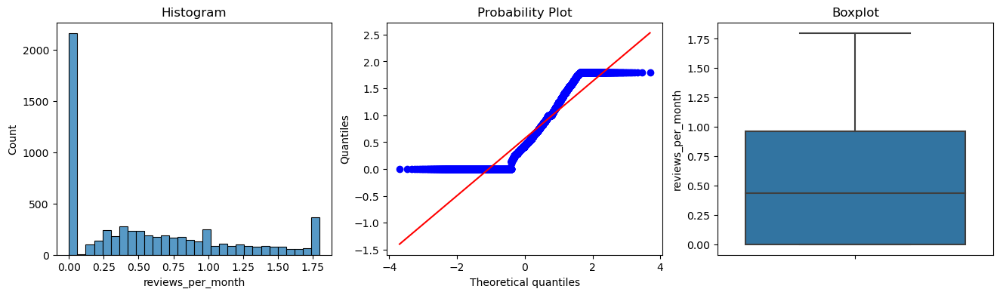

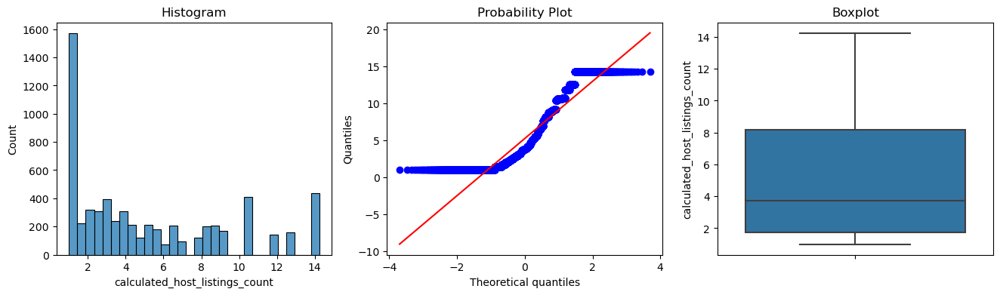

In [100]:
# using square root transformation
# set up PowerTransformer with the square root exponent
et = PowerTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'], exp=1/2)

# fit transformer to data 
et.fit(cr_df_w)

# transform indicated variables within our dataframe
cr_df_sq = et.transform(cr_df_w)

# display diagnostic plots
diagnostic_plots(cr_df_sq, 'minimum_nights')
diagnostic_plots(cr_df_sq, 'number_of_reviews')
diagnostic_plots(cr_df_sq, 'reviews_per_month')
diagnostic_plots(cr_df_sq, 'calculated_host_listings_count')

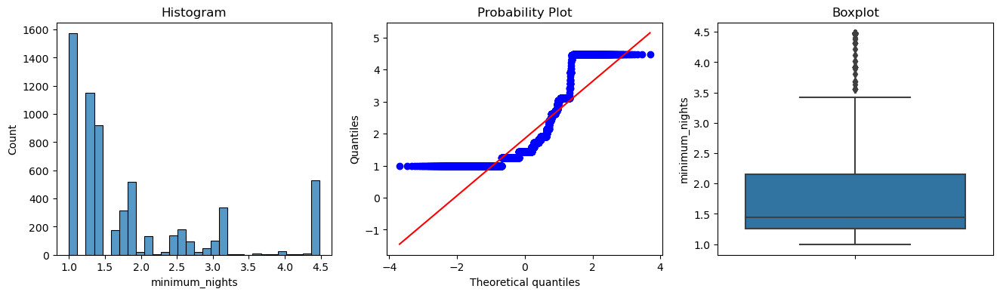

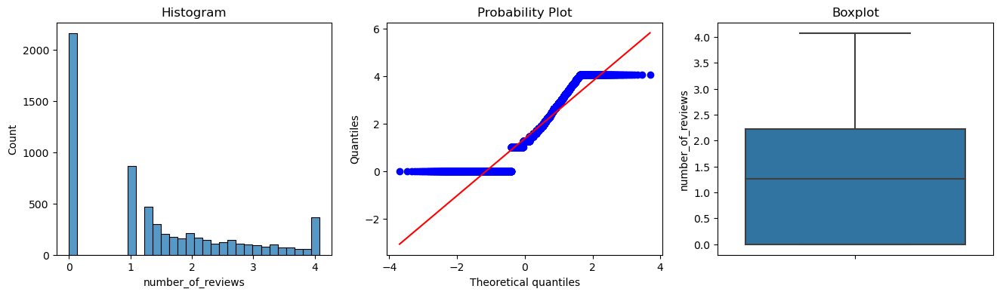

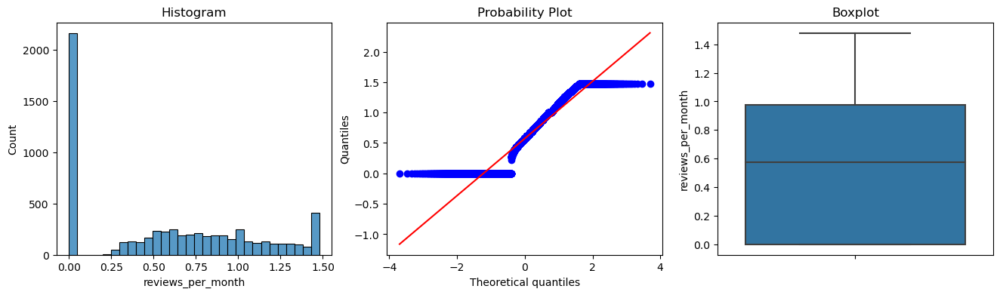

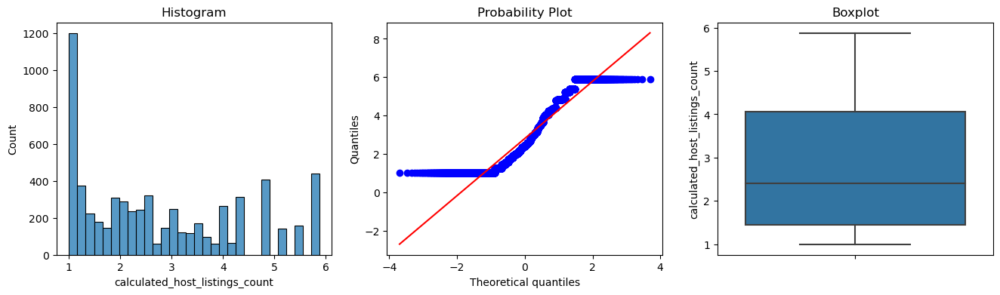

In [101]:
# using cube root transformation
# set up PowerTransformer with the square root exponent
et = PowerTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'], exp=1/3)

# fit transformer to data 
et.fit(cr_df_w)

# transform indicated variables within our dataframe
cr_df_cr = et.transform(cr_df_w)

# display diagnostic plots
diagnostic_plots(cr_df_cr, 'minimum_nights')
diagnostic_plots(cr_df_cr, 'number_of_reviews')
diagnostic_plots(cr_df_cr, 'reviews_per_month')
diagnostic_plots(cr_df_cr, 'calculated_host_listings_count')

In [1]:
# using power transformation

# initialize the transformer with the variables to transform and the desired exponent

et = PowerTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'], exp=0.4)

# fit transformer to data
et.fit(cr_df_w)

# transform indicated variables in the dataset
cr_df_p = et.transform(cr_df_w)

# display diagnostic plots
diagnostic_plots(cr_df_p, 'minimum_nights')
diagnostic_plots(cr_df_p, 'number_of_reviews')
diagnostic_plots(cr_df_p, 'reviews_per_month')
diagnostic_plots(cr_df_p, 'calculated_host_listings_count')

NameError: name 'PowerTransformer' is not defined

In [ ]:
# using box-cox transformation
# initialize the transformer with a group of variables to transform
#bct = BoxCoxTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'])

# fit transformer to the data set
#bct.fit(cr_df_w)

# transform the indicated variables in our dataframe and returns a new dataframe
#cr_df_bc = bct.transform(cr_df_w)

# display diagnostic plots
#diagnostic_plots(cr_df_bc, 'minimum_nights')
#diagnostic_plots(cr_df_bc, 'number_of_reviews')
#diagnostic_plots(cr_df_bc, 'reviews_per_month')
#diagnostic_plots(cr_df_bc, 'calculated_host_listings_count')

In [ ]:
# using yeo-johnson transformation
# initialize the transformer with a subset of variables to transform
yjt = YeoJohnsonTransformer(variables = ['minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count'])

# fit transformer to the dataframe
yjt.fit(cr_df_w)

# transform indicated variables
cr_df_yj = yjt.transform(cr_df_w)

# display diagnostic plots
diagnostic_plots(cr_df_yj, 'minimum_nights')
diagnostic_plots(cr_df_yj, 'number_of_reviews')
diagnostic_plots(cr_df_yj, 'reviews_per_month')
diagnostic_plots(cr_df_yj, 'calculated_host_listings_count')

### 2.2.9 Feature Scaling

In [ ]:
# Standardisation
# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
x = ['reviews_per_month', 'availability_365', 'number_of_reviews', 'minimum_nights', 'latitude', 'longitude', 'calculated_host_listings_count']
scaler.fit(cr_df_yj[x])

# transform train and test sets
cr_df_s = cr_df_yj.copy()
cr_df_s[x] =  scaler.transform(cr_df_yj[x])

In [ ]:
# Compare the variable distributions before and after scaling

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(cr_df_yj['reviews_per_month'], ax=ax1, label ='reviews_per_month')
sns.kdeplot(cr_df_yj['availability_365'], ax=ax1, label ='availability_365')
sns.kdeplot(cr_df_yj['number_of_reviews'], ax=ax1, label ='number_of_reviews')
sns.kdeplot(cr_df_yj['minimum_nights'], ax=ax1, label ='minimum_nights')
sns.kdeplot(cr_df_yj['latitude'], ax=ax1, label ='latitude')
sns.kdeplot(cr_df_yj['longitude'], ax=ax1, label ='longitude')
sns.kdeplot(cr_df_yj['calculated_host_listings_count'], ax=ax1, label ='calculated_host_listings_count')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(cr_df_s['reviews_per_month'], ax=ax2, label ='reviews_per_month')
sns.kdeplot(cr_df_s['availability_365'], ax=ax2, label ='availability_365')
sns.kdeplot(cr_df_s['number_of_reviews'], ax=ax2, label ='number_of_reviews')
sns.kdeplot(cr_df_s['minimum_nights'], ax=ax2, label ='minimum_nights')
sns.kdeplot(cr_df_s['latitude'], ax=ax2, label ='latitude')
sns.kdeplot(cr_df_s['longitude'], ax=ax2, label ='longitude')
sns.kdeplot(cr_df_s['calculated_host_listings_count'], ax=ax2, label ='calculated_host_listings_count')
plt.show()

### 2.2.10 Encoding Categorical Variables

In [ ]:
# Categorical encoding
# One-hot encoding
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True, variables= ['room_type'])

ohe_enc.fit(cr_df_s)

cr_df_enc = ohe_enc.transform(cr_df_s)

cr_df_enc.head()

In [ ]:
# Frequency encoding
count_enc = CountFrequencyEncoder(
    encoding_method='frequency', 
    variables='neighbourhood')

count_enc.fit(cr_df_enc)

cr_df_enc = count_enc.transform(cr_df_enc)

cr_df_enc.head()

In [ ]:
cr_df_enc.drop(columns=['name'], inplace = True)

### 2.3 Correlation Analysis

### 2.3.1 Correlation Matrix

In [ ]:
# Heatmap: the correlation between any two features/variables
cmap = sns.diverging_palette(220, 10, as_cmap=True)
plt.figure(figsize=(20,20))
plt.title('Pearson Correlation of Features', size=15)
ax = sns.heatmap(cr_df_enc.astype(float).corr(), cmap=cmap, annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

### 2.3.2 Feature Adding

In [ ]:
# Polynomial Expansion
# set up the polynomial expansion transformer
poly = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)

# train the polynomial expansion transformer
poly.fit(cr_df_enc[['calculated_host_listings_count','neighbourhood','availability_365', 'number_of_reviews']])

# create new features
new_features = poly.transform(cr_df_enc[['calculated_host_listings_count','neighbourhood','availability_365', 'number_of_reviews']])

poly.get_feature_names_out(['calculated_host_listings_count','neighbourhood','availability_365', 'number_of_reviews'])

In [ ]:
# capture the returned features in a dataframe
new_features = pd.DataFrame(new_features)

# add column names of created features
new_features.columns = poly.get_feature_names_out(['calculated_host_listings_count','neighbourhood','availability_365', 'number_of_reviews'])

In [ ]:
# reset index of main dataframe
cr_df_enc.reset_index(drop=True,inplace =True)

#add new features to dataframe
cr_df_poly = pd.concat([cr_df_enc,new_features], axis=1)

In [ ]:
cr_df_enc.shape, new_features.shape, cr_df_poly.shape

### 2.4 Export the Data

In [ ]:
cr_df_poly.to_csv('listings_new.csv')